In [1]:
# --- IMPORTS & SETUP ---
import sys
from pathlib import Path
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# --- PROJECT SETUP ---
# Add the project root to the Python path to allow importing utility modules
PROJECT_ROOT = Path("/home/minhang/mds_project/sc_classification")
if str(PROJECT_ROOT) not in sys.path:
    sys.path.append(str(PROJECT_ROOT))

# --- UTILITY IMPORTS ---
# Import the necessary classes from our custom utility modules
from utils.experiment_manager import ExperimentManager
from utils.experiment_analysis import ExperimentAnalyzer

/home/minhang/miniconda3/envs/mds_responder_analysis/lib/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/home/minhang/miniconda3/envs/mds_responder_analysis/lib/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/home/minhang/miniconda3/envs/mds_responder_analysis/lib/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_hdf from `anndata` is deprecated. Import anndata.io.read_hdf instead.
  warnings.warn(msg, FutureWarning)
/home/minhang/miniconda3/envs/mds_responder_analysis/lib/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
/home/minhang/miniconda3/envs/mds_

#### Load experiment

In [2]:
# --- Base Directory ---
BASE_EXPERIMENT_DIR = PROJECT_ROOT / "experiments"

# --- Experiment Metadata ---
# Dictionary to store information about each experiment run
experiments = {
    "pan_patient_all_filtered": {
        "id": "20250819_230359_fa_100_none_all_filtered_7a2dc57f",
        "label": "Pan-Patient (All Filtered Genes)",
        "type": "pan-patient"
    },
    "per_patient_all_filtered": {
        "id": "20250819_232404_fa_100_random_all_filtered_f85f0e07",
        "label": "Per-Patient (All Filtered Genes)",
        "type": "per-patient"
    }
    #"per_patient_deg_weak": {
    #    "id": "20250820_024407_fa_100_random_deg_weak_screen_bf7e9669",
    #    "label": "Per-Patient (DEG Weak Screen)",
    #    "type": "per-patient"
    #}
}

# Add full path to each experiment dictionary entry
for key, data in experiments.items():
    experiments[key]['path'] = BASE_EXPERIMENT_DIR / data['id']

# --- Initialize Managers ---
manager = ExperimentManager(BASE_EXPERIMENT_DIR)
analyzer = ExperimentAnalyzer(manager)

print("Setup complete. Experiments to analyze:")
for key, data in experiments.items():
    print(f"- {key}: {data['id']}")

Setup complete. Experiments to analyze:
- pan_patient_all_filtered: 20250819_230359_fa_100_none_all_filtered_7a2dc57f
- per_patient_all_filtered: 20250819_232404_fa_100_random_all_filtered_f85f0e07


#### Sanity check wrt pan- & per- patient FA (should be the same)

In [3]:
# In a new cell: FA Sanity Check
print("--- Comparing Factor Analysis Loadings ---")

# Define the two experiments to compare
pan_patient_exp_path = experiments['pan_patient_all_filtered']['path']
per_patient_exp_path = experiments['per_patient_all_filtered']['path']

# Load FA loadings from the pan-patient experiment
adata_pan_patient_path = pan_patient_exp_path / "models" / "fa_100" / "transformed_data.h5ad"
adata_pan_patient = sc.read_h5ad(adata_pan_patient_path)
loadings_pan_patient = adata_pan_patient.varm['FA_loadings']

# Load FA loadings from the per-patient experiment
adata_per_patient_path = per_patient_exp_path / "models" / "fa_100" / "transformed_data.h5ad"
adata_per_patient = sc.read_h5ad(adata_per_patient_path)
loadings_per_patient = adata_per_patient.varm['FA_loadings']

# Check if they are numerically close (accounting for potential floating point dust)
are_identical = np.allclose(loadings_per_patient, loadings_pan_patient)

if are_identical:
    print("✅ SUCCESS: The Factor Analysis loadings are numerically identical between the two experiments.")
else:
    print("❌ FAILURE: The Factor Analysis loadings are different. Check the pipeline configurations.")


--- Comparing Factor Analysis Loadings ---
✅ SUCCESS: The Factor Analysis loadings are numerically identical between the two experiments.


### FA diagnosis 
1. GSEA on all factors and signficant hits
2. factor SS and gene communality 

In [9]:
''' 
# In a new cell: Run GSEA on All Factors
print("--- Running GSEA on All Factors for Each Experiment ---")

for key, exp_data in experiments.items():
    exp_id = exp_data["id"]
    print(f"\nProcessing experiment: {exp_data['label']} ({exp_id})")
    
    try:
        analyzer.run_gsea_on_factors(
            experiment_id=exp_id,
            rescale_loadings=False # Use rescaled loadings for better biological interpretation
        )
        print(f"  ✅ GSEA analysis complete for {exp_id}.")
    except Exception as e:
        print(f"  ❌ ERROR: Could not run GSEA for {exp_id}. Reason: {e}")

print("\n--- GSEA Analysis Finished ---")
print("Check the 'analysis/gsea_on_all_factors' directory within each experiment folder for results.")
''' 

' \n# In a new cell: Run GSEA on All Factors\nprint("--- Running GSEA on All Factors for Each Experiment ---")\n\nfor key, exp_data in experiments.items():\n    exp_id = exp_data["id"]\n    print(f"\nProcessing experiment: {exp_data[\'label\']} ({exp_id})")\n    \n    try:\n        analyzer.run_gsea_on_factors(\n            experiment_id=exp_id,\n            rescale_loadings=False # Use rescaled loadings for better biological interpretation\n        )\n        print(f"  ✅ GSEA analysis complete for {exp_id}.")\n    except Exception as e:\n        print(f"  ❌ ERROR: Could not run GSEA for {exp_id}. Reason: {e}")\n\nprint("\n--- GSEA Analysis Finished ---")\nprint("Check the \'analysis/gsea_on_all_factors\' directory within each experiment folder for results.")\n'

--- Generating Factor Analysis Diagnostic Plots ---
Generating FA diagnostic data for: Pan-Patient (All Filtered Genes)
--- Generating FA-specific diagnostic plots ---
Loading experiment from: /home/minhang/mds_project/sc_classification/experiments/20250819_230359_fa_100_none_all_filtered_7a2dc57f
  Saved SS Loadings plot to /home/minhang/mds_project/sc_classification/experiments/20250819_230359_fa_100_none_all_filtered_7a2dc57f/analysis/dimension_reduction_diagnostics/ss_loadings_per_factor.png
  Saved Gene Communality plot to /home/minhang/mds_project/sc_classification/experiments/20250819_230359_fa_100_none_all_filtered_7a2dc57f/analysis/dimension_reduction_diagnostics/gene_communality_distribution.png
Generating FA diagnostic data for: Per-Patient (All Filtered Genes)
--- Generating FA-specific diagnostic plots ---
Loading experiment from: /home/minhang/mds_project/sc_classification/experiments/20250819_232404_fa_100_random_all_filtered_f85f0e07
  Saved SS Loadings plot to /home/mi

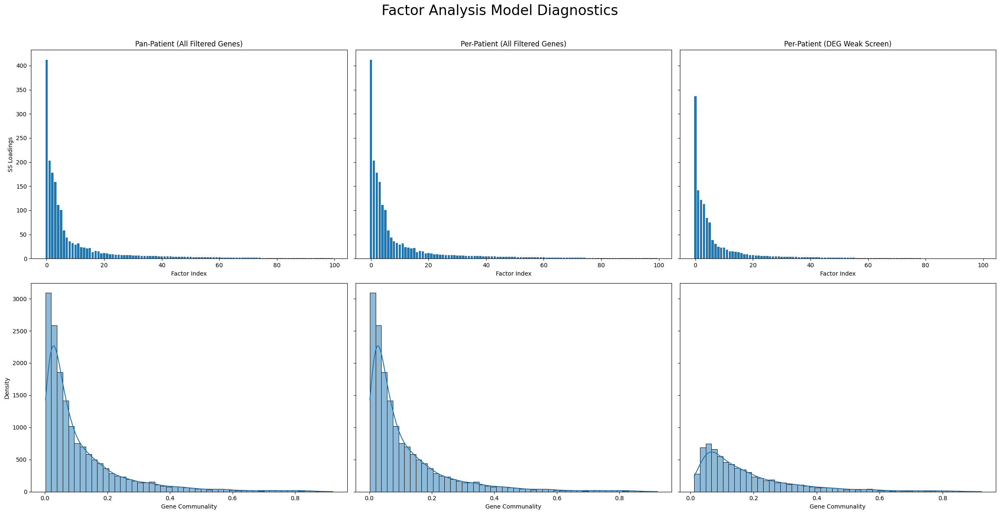

In [6]:
# In a new cell: FA Diagnostic Plots
print("--- Generating Factor Analysis Diagnostic Plots ---")

# First, run the analysis to generate the data for the plots
for key, exp_data in experiments.items():
    exp_id = exp_data["id"]
    print(f"Generating FA diagnostic data for: {exp_data['label']}")
    try:
        analyzer.generate_fa_diagnostic_plots(exp_id)
    except Exception as e:
        print(f"  ERROR generating data for {exp_id}: {e}")

# Now, create the plots
num_experiments = len(experiments)
fig, axes = plt.subplots(2, num_experiments, figsize=(8 * num_experiments, 12), sharey='row')
fig.suptitle("Factor Analysis Model Diagnostics", fontsize=24, y=1.02)

for i, (key, exp_data) in enumerate(experiments.items()):
    # Load the transformed data which contains model details
    adata_path = exp_data["path"] / "models" / "fa_100" / "transformed_data.h5ad"
    adata = sc.read_h5ad(adata_path)

    # Panel 1: Sum of Square (SS) Loadings per Factor
    ss_loadings = adata.uns['fa']['ss_loadings_per_factor']
    axes[0, i].bar(range(len(ss_loadings)), ss_loadings)
    axes[0, i].set_title(exp_data['label'])
    axes[0, i].set_xlabel("Factor Index")

    # Panel 2: Gene Communality Distribution
    communality = adata.var['communality']
    sns.histplot(communality, ax=axes[1, i], bins=50, kde=True)
    axes[1, i].set_xlabel("Gene Communality")

axes[0, 0].set_ylabel("SS Loadings")
axes[1, 0].set_ylabel("Density")
plt.tight_layout(rect=[0, 0, 1, 1])
plt.show()


### Second Stage LR-lasso 2-panels report
Pick a list of indices for downstream decision boundary analysis

In [3]:
# In a new cell: Generate 2-Panel Lasso Path Reports as PDFs
print("--- Generating 2-Panel LASSO Path Reports for All Experiments (as PDF) ---")

for key, exp_data in experiments.items():
    exp_id = exp_data["id"]
    print(f"\nProcessing experiment: {exp_data['label']} ({exp_id})")
    try:
        # Call the modified function with new parameters
        analyzer.generate_lasso_path_2panels_report(
            exp_id, 
            save_format='pdf', 
            dpi=600
        )
    except Exception as e:
        print(f"  ERROR: Could not generate report for {exp_id}. Reason: {e}")

print("\n--- PDF report generation complete. ---")
print("Check the 'summary_plots' directory within each experiment folder.")

--- Generating 2-Panel LASSO Path Reports for All Experiments (as PDF) ---

Processing experiment: Pan-Patient (All Filtered Genes) (20250819_230359_fa_100_none_all_filtered_7a2dc57f)
Loading experiment from: /home/minhang/mds_project/sc_classification/experiments/20250819_230359_fa_100_none_all_filtered_7a2dc57f

Processing experiment: Per-Patient (All Filtered Genes) (20250819_232404_fa_100_random_all_filtered_f85f0e07)
Loading experiment from: /home/minhang/mds_project/sc_classification/experiments/20250819_232404_fa_100_random_all_filtered_f85f0e07

--- PDF report generation complete. ---
Check the 'summary_plots' directory within each experiment folder.


In [4]:
# Block 11: Generate 2-Panel Lasso Path Reports for CV Experiments
print("--- Generating 2-Panel LASSO Path Reports for CV Experiments (as PDF) ---")

# --- List of experiment IDs that used Cross-Validation ---
cv_experiment_ids = [
    "20250821_182045_fa_100_none_all_filtered_ff2211a1",      # Pan-patient with CV
    "20250824_082404_fa_100_random_all_filtered_3718c874"   # Per-patient with CV
]

for exp_id in cv_experiment_ids:
    print(f"\nProcessing experiment: {exp_id}")
    try:
        # Call the modified function with new parameters
        analyzer.generate_lasso_path_2panels_report_internal_CV(
            exp_id, 
            save_format='pdf', 
            dpi=600
        )
    except Exception as e:
        print(f"  ERROR: Could not generate report for {exp_id}. Reason: {e}")

print("\n--- CV PDF report generation complete. ---")
print("Check the 'summary_plots' directory within each experiment folder.")

--- Generating 2-Panel LASSO Path Reports for CV Experiments (as PDF) ---

Processing experiment: 20250821_182045_fa_100_none_all_filtered_ff2211a1
--- Generating Internal CV Analysis Report for Experiment: 20250821_182045_fa_100_none_all_filtered_ff2211a1 ---
Loading experiment from: /home/minhang/mds_project/sc_classification/experiments/20250821_182045_fa_100_none_all_filtered_ff2211a1
Loading experiment from: /home/minhang/mds_project/sc_classification/experiments/20250821_182045_fa_100_none_all_filtered_ff2211a1
Generating plot for patient: all_patients
  Saved plot to /home/minhang/mds_project/sc_classification/experiments/20250821_182045_fa_100_none_all_filtered_ff2211a1/analysis/summary_plots/pan_patient_CV_metrics_and_coefficients.pdf

Processing experiment: 20250824_082404_fa_100_random_all_filtered_3718c874
--- Generating Internal CV Analysis Report for Experiment: 20250824_082404_fa_100_random_all_filtered_3718c874 ---
Loading experiment from: /home/minhang/mds_project/sc_c

In [5]:
pan_patient_indices = list(range(11, 20))

# For the per-patient "all_filtered" run
per_patient_all_filtered_indices = {
    'P01': list(range(10, 14)),
    'P02': list(range(12, 17)),
    'P03': list(range(12, 17)),
    'P04': list(range(11, 16)),
    'P05': list(range(10, 14)),
    'P06': list(range(9, 14)),
    'P07': [10, 11, 12, 13],
    'P09': list(range(12, 18)),
    'P13': list(range(11, 14))
}

# For the per-patient "deg_weak_screen" run
per_patient_deg_weak_indices = {
    'P01': list(range(9, 14)),
    'P02': list(range(11, 17)),
    'P03': list(range(10, 17)),
    'P04': list(range(10, 15)),
    'P05': list(range(10, 14)),
    'P06': [10, 11, 12, 13],
    'P07': [10, 11, 12, 13],
    'P09': list(range(12, 18)),
    'P13': [10, 11, 12, 13]
}

# --- Attach indices to the main experiments dictionary ---
experiments['pan_patient_all_filtered']['indices'] = pan_patient_indices
experiments['per_patient_all_filtered']['indices'] = per_patient_all_filtered_indices
experiments['per_patient_deg_weak']['indices'] = per_patient_deg_weak_indices

print("✅ Indices have been defined and attached to the experiments dictionary.")
print("Ready for downstream classification analysis.")

✅ Indices have been defined and attached to the experiments dictionary.
Ready for downstream classification analysis.


In [1]:
'''
# Run Downstream Classification Analysis (decision boundary analysis, UMAPs, GSEA on predictive loadings)
for key, exp_data in experiments.items():
    exp_id = exp_data["id"]
    indices = exp_data["indices"]
    
    print(f"\n{'='*80}")
    print(f"--- Starting Downstream Analysis for: {exp_data['label']} ({exp_id}) ---")
    print(f"{'='*80}")

    # Determine if this is a pan-patient or per-patient run to structure the loops correctly
    is_pan_patient = exp_data["type"] == "pan-patient"
    
    # For pan-patient, we use a dictionary with a single key.
    # For per-patient, the indices object is already a dictionary.
    if is_pan_patient:
        patient_indices_dict = {'all_patients': indices}
    else:
        patient_indices_dict = indices

    # --- 1. Analyze Classification Transitions ---
    print("\n--- 1. Analyzing classification transitions ---")
    try:
        # Loop over each patient/group and their corresponding indices
        for patient_id, indices_to_check in patient_indices_dict.items():
            print(f"  Analyzing transitions for patient/group: {patient_id}")
            analyzer.analyze_classification_transitions(
                experiment_id=exp_id,
                patient_id=patient_id,
                indices_to_check=indices_to_check
            )
        print("  Transition analysis complete.")
    except Exception as e:
        print(f"  ERROR during transition analysis: {e}")

    # --- 2. Generate Classification UMAP Reports ---
    print("\n--- 2. Generating classification UMAP reports ---")
    try:
        # This function correctly takes a dictionary for both pan- and per-patient runs
        analyzer.generate_classification_umap_report(
            experiment_id=exp_id,
            patient_reg_strength_indices=patient_indices_dict,
            static_umap_rep='X_multivi'
        )
        print("  UMAP report generation complete.")
    except Exception as e:
        print(f"  ERROR during UMAP report generation: {e}")

    # --- 3. Run GSEA on Predictive Loadings ---
    print("\n--- 3. Running GSEA on predictive factor loadings ---")
    try:
        # Loop over each patient/group
        for patient_id, indices_to_check in patient_indices_dict.items():
            print(f"  Running GSEA for patient/group: {patient_id}")
            # Loop over each individual index for the patient/group
            for alpha_idx in indices_to_check:
                analyzer.run_gsea_on_predictive_loading(
                    experiment_id=exp_id,
                    patient_id=patient_id,
                    alpha_index=alpha_idx
                )
        print("  GSEA analysis complete.")
    except Exception as e:
        print(f"  ERROR during GSEA: {e}")

print(f"\n{'='*80}")
print("--- All Analyses Finished ---")
print("Check the 'analysis' directory within each experiment folder for results.")
print(f"{'='*80}")
'''


'\n# Run Downstream Classification Analysis (decision boundary analysis, UMAPs, GSEA on predictive loadings)\nfor key, exp_data in experiments.items():\n    exp_id = exp_data["id"]\n    indices = exp_data["indices"]\n    \n    print(f"\n{\'=\'*80}")\n    print(f"--- Starting Downstream Analysis for: {exp_data[\'label\']} ({exp_id}) ---")\n    print(f"{\'=\'*80}")\n\n    # Determine if this is a pan-patient or per-patient run to structure the loops correctly\n    is_pan_patient = exp_data["type"] == "pan-patient"\n    \n    # For pan-patient, we use a dictionary with a single key.\n    # For per-patient, the indices object is already a dictionary.\n    if is_pan_patient:\n        patient_indices_dict = {\'all_patients\': indices}\n    else:\n        patient_indices_dict = indices\n\n    # --- 1. Analyze Classification Transitions ---\n    print("\n--- 1. Analyzing classification transitions ---")\n    try:\n        # Loop over each patient/group and their corresponding indices\n        

#### Using the find_best_tradeoff_alpha() algorithm to find best reg strength for downstream analyses

In [3]:
# --- Find Best Alpha for Pan-Patient Experiment ---

print("--- Finding Best Regularization Strength for Pan-Patient Experiment ---")

# Get pan-patient experiment info
pan_patient_exp = experiments["pan_patient_all_filtered"]
exp_id = pan_patient_exp['id']
print(f"\nProcessing Experiment: {pan_patient_exp['label']} ({exp_id})")

# Extract results
try:
    results = analyzer.extract_classification_results(exp_id)
    
    # --- CHANGE: Extract the correct DataFrames for pan-patient ---
    # The metrics are already aggregated, and coefficients are in a dict
    metrics_df = results['metrics']
    coefficients_df = results['coefficients'].get('all_patients') # Get DataFrame from dict
    # -----------------------------------------------------------------

    if metrics_df.empty or coefficients_df is None or coefficients_df.empty:
        print("  - Skipping (no metrics or coefficients found)")
    else:
        # Find the best alpha using the specified algorithm
        # The logic is the same, but we pass the correct DataFrames now.
        best_alpha = analyzer.find_best_tradeoff_alpha(
            metrics_df, 
            coefficients_df, 
            performance_metric='roc_auc'
        )
        print(best_alpha)
        # Parse alpha values from coefficient columns to find the corresponding index
        try:
            coef_alphas = np.array([float(c.split('_')[1]) for c in coefficients_df.columns])
        except (ValueError, IndexError):
            # If parsing fails (e.g., columns are just floats), try direct conversion
            coef_alphas = coefficients_df.columns.astype(float)
        
        # Find the index of the alpha closest to the best_alpha
        best_alpha_idx = (np.abs(coef_alphas - best_alpha)).argmin()
        
        # Display index as 1-based (e.g., 1-20)
        print(f"\n  - Best alpha for pan-patient model: {best_alpha:.4f} (index {best_alpha_idx + 1})")

        # --- Optional: Print top factors at the best alpha ---
        closest_alpha_col = coefficients_df.columns[best_alpha_idx]
        top_factors_at_best_alpha = coefficients_df[closest_alpha_col].abs().nlargest(5)
        print(f"    - Top 5 factors at this alpha:")
        for factor, coef in top_factors_at_best_alpha.items():
            print(f"      - {factor}: {coef:.4f}")
        # ---------------------------------------------------

except Exception as e:
    print(f"  - ERROR: Could not determine best alpha for the pan-patient experiment.")
    print(f"    Details: {e}")

--- Finding Best Regularization Strength for Pan-Patient Experiment ---

Processing Experiment: Pan-Patient (All Filtered Genes) (20250819_230359_fa_100_none_all_filtered_7a2dc57f)
Loading experiment from: /home/minhang/mds_project/sc_classification/experiments/20250819_230359_fa_100_none_all_filtered_7a2dc57f
0.7889475310913105 is the trade-off score of the best point
3792.690190732246

  - Best alpha for pan-patient model: 3792.6902 (index 17)
    - Top 5 factors at this alpha:
      - X_fa_18: 0.7042
      - X_fa_36: 0.4290
      - X_fa_8: 0.2111
      - X_fa_33: 0.2089
      - X_fa_35: 0.2076


--- Clustering Patients by Factor Coefficients (Maximizing Performance - Feature Cost) ---

Processing Experiment: Per-Patient (All Filtered Genes)
Loading experiment from: /home/minhang/mds_project/sc_classification/experiments/20250819_232404_fa_100_random_all_filtered_f85f0e07
0.8360630449362844 is the trade-off score of the best point
  - Best alpha for P01: 48.3293 (index 13)
    - Top 5 factors for P01 at this alpha:
      - X_fa_71: 0.4490
      - X_fa_36: 0.2917
      - X_fa_88: 0.2387
      - X_fa_80: 0.2121
      - X_fa_93: 0.1493
0.9814153984868976 is the trade-off score of the best point
  - Best alpha for P02: 143.8450 (index 14)
    - Top 5 factors for P02 at this alpha:
      - X_fa_46: 0.9286
      - X_fa_1: 0.0000
      - X_fa_2: 0.0000
      - X_fa_3: 0.0000
      - X_fa_4: 0.0000
0.9897015055889924 is the trade-off score of the best point
  - Best alpha for P03: 428.1332 (index 15)
    - Top 5 factors for P03 at this alpha:
      - X_fa_18: 0.9081
      - X_fa_1: 0.0

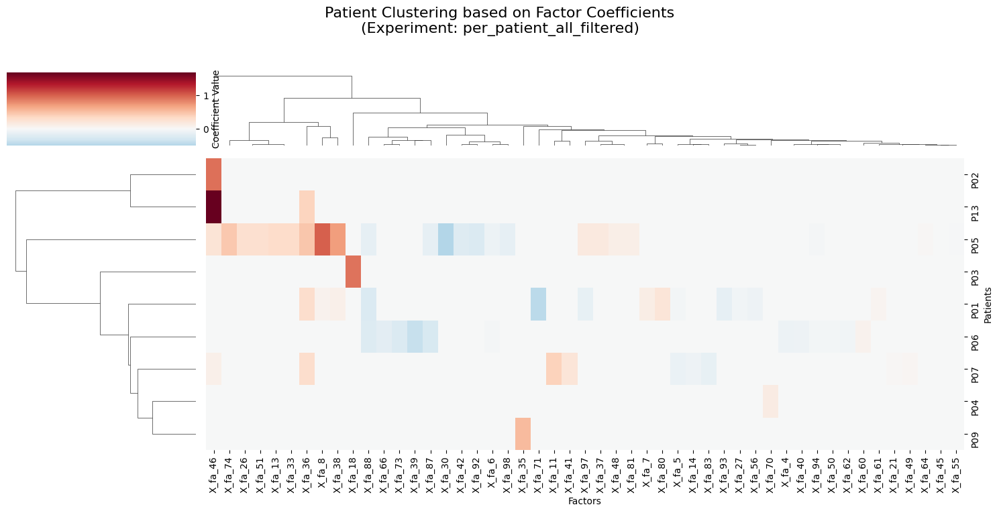


Processing Experiment: Per-Patient (DEG Weak Screen)
Loading experiment from: /home/minhang/mds_project/sc_classification/experiments/20250820_024407_fa_100_random_deg_weak_screen_bf7e9669
0.8130963559132572 is the trade-off score of the best point
  - Best alpha for P01: 48.3293 (index 13)
    - Top 5 factors for P01 at this alpha:
      - X_fa_8: 0.3567
      - X_fa_40: 0.3396
      - X_fa_66: 0.2968
      - X_fa_34: 0.1698
      - X_fa_37: 0.1280
0.9715086319569936 is the trade-off score of the best point
  - Best alpha for P02: 428.1332 (index 15)
    - Top 5 factors for P02 at this alpha:
      - X_fa_45: 0.6099
      - X_fa_1: 0.0000
      - X_fa_2: 0.0000
      - X_fa_3: 0.0000
      - X_fa_4: 0.0000
0.9887286660579062 is the trade-off score of the best point
  - Best alpha for P03: 428.1332 (index 15)
    - Top 5 factors for P03 at this alpha:
      - X_fa_17: 0.9164
      - X_fa_1: 0.0000
      - X_fa_2: 0.0000
      - X_fa_3: 0.0000
      - X_fa_4: 0.0000
0.9045633146045942 

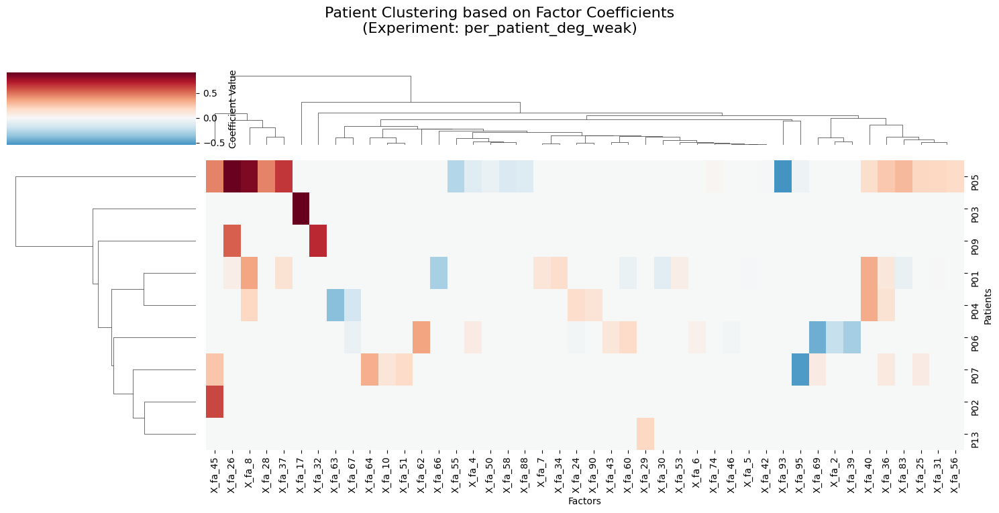

In [4]:
print("--- Clustering Patients by Factor Coefficients (Maximizing Performance - Feature Cost) ---")

# We will demonstrate with the two per-patient experiments
per_patient_experiments_to_cluster = {
    "per_patient_all_filtered": experiments["per_patient_all_filtered"],
    "per_patient_deg_weak": experiments["per_patient_deg_weak"]
}

for key, exp_data in per_patient_experiments_to_cluster.items():
    exp_id = exp_data['id']
    print(f"\nProcessing Experiment: {exp_data['label']}")
    
    results = analyzer.extract_classification_results(exp_id)
    all_metrics_df = results['metrics']
    all_coefficients = results['coefficients']
    
    optimal_coef_vectors = {}
    patients = sorted(all_coefficients.keys())

    for patient_id in patients:
        patient_metrics = all_metrics_df[all_metrics_df['group'] == patient_id]
        patient_coefs = all_coefficients.get(patient_id)

        if patient_metrics.empty or patient_coefs is None:
            print(f"  - Skipping {patient_id} (no metrics or coefficients found)")
            continue
        
        try:
            # Find the best alpha using the new, user-specified algorithm
            best_alpha = analyzer.find_best_tradeoff_alpha(
                patient_metrics, 
                patient_coefs, 
                performance_metric='roc_auc'  # You can change this to 'overall_accuracy', etc.
            )
            
            # Parse alpha values from coefficient columns to find the corresponding index
            try:
                coef_alphas = np.array([float(c.split('_')[1]) for c in patient_coefs.columns])
            except (ValueError, IndexError):
                coef_alphas = patient_coefs.columns.astype(float)
            
            best_alpha_idx = (np.abs(coef_alphas - best_alpha)).argmin()
            
            # Display index as 1-based (1-20)
            print(f"  - Best alpha for {patient_id}: {best_alpha:.4f} (index {best_alpha_idx + 1})")

            # Extract the coefficient vector at that alpha
            closest_alpha_col = patient_coefs.columns[best_alpha_idx]
            optimal_coef_vectors[patient_id] = patient_coefs[closest_alpha_col]

            # --- New: Print top factors at the best alpha ---
            top_factors_at_best_alpha = patient_coefs[closest_alpha_col].abs().nlargest(5)
            print(f"    - Top 5 factors for {patient_id} at this alpha:")
            for factor, coef in top_factors_at_best_alpha.items():
                print(f"      - {factor}: {coef:.4f}")
            # ---------------------------------------------------
        
        except (KeyError, ValueError) as e:
            print(f"  - ERROR for {patient_id}: Could not determine best alpha.")
            print(f"    Details: {e}")

    if not optimal_coef_vectors:
        print("\nCould not determine optimal coefficients for any patient. Aborting clustering.")
        continue

    # Create the patient-factor matrix for clustering
    patient_factor_df = pd.DataFrame(optimal_coef_vectors).T.fillna(0)
    patient_factor_df = patient_factor_df.loc[:, (patient_factor_df != 0).any(axis=0)]

    if patient_factor_df.empty:
        print("\nNo factors with non-zero coefficients found across all patients. Aborting clustering.")
        continue
        
    # Generate the clustermap
    print(f"\nGenerating clustermap for {key}...")
    g = sns.clustermap(
        patient_factor_df,
        method='ward', metric='euclidean',
        cmap='RdBu_r', center=0,
        figsize=(max(15, patient_factor_df.shape[1] * 0.25), 
                 max(8, patient_factor_df.shape[0] * 0.6)),
        cbar_kws={'label': 'Coefficient Value'}
    )
    g.fig.suptitle(f"Patient Clustering based on Factor Coefficients\n(Experiment: {key})", fontsize=16)
    g.ax_heatmap.set_xlabel("Factors")
    g.ax_heatmap.set_ylabel("Patients")
    g.fig.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

--- Heatmap of Patient Factor Coefficients (Sorted, No Clustering) ---

Processing Experiment: Per-Patient (All Filtered Genes)
Loading experiment from: /home/minhang/mds_project/sc_classification/experiments/20250819_232404_fa_100_random_all_filtered_f85f0e07
0.8360630449362844 is the trade-off score of the best point
0.9814153984868976 is the trade-off score of the best point
0.9897015055889924 is the trade-off score of the best point
0.8932412185146962 is the trade-off score of the best point
0.77 is the trade-off score of the best point
0.8043682891911238 is the trade-off score of the best point
0.8850988142292489 is the trade-off score of the best point
0.9656268287761072 is the trade-off score of the best point
0.98 is the trade-off score of the best point

Generating sorted heatmap for per_patient_all_filtered...
  - Saved high-resolution heatmap to: sorted_heatmap_per_patient_all_filtered.png


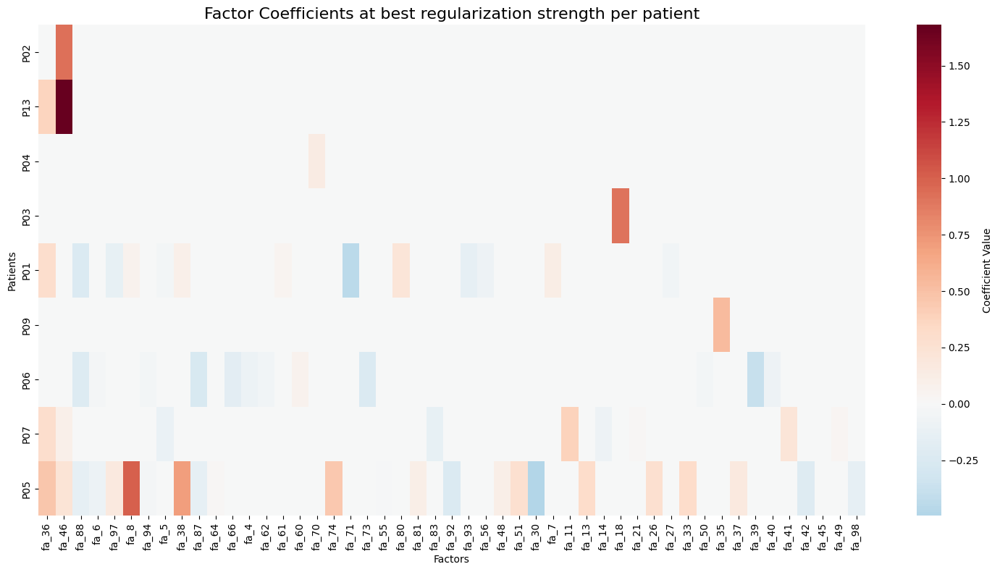

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

print("--- Heatmap of Patient Factor Coefficients (Sorted, No Clustering) ---")

# We will demonstrate with the two per-patient experiments
per_patient_experiments_to_cluster = {
    "per_patient_all_filtered": experiments["per_patient_all_filtered"],
    #"per_patient_deg_weak": experiments["per_patient_deg_weak"]
}

for key, exp_data in per_patient_experiments_to_cluster.items():
    exp_id = exp_data['id']
    print(f"\nProcessing Experiment: {exp_data['label']}")
    
    results = analyzer.extract_classification_results(exp_id)
    all_metrics_df = results['metrics']
    all_coefficients = results['coefficients']
    
    optimal_coef_vectors = {}
    patients = sorted(all_coefficients.keys())

    for patient_id in patients:
        patient_metrics = all_metrics_df[all_metrics_df['group'] == patient_id]
        patient_coefs = all_coefficients.get(patient_id)

        if patient_metrics.empty or patient_coefs is None:
            print(f"  - Skipping {patient_id} (no metrics or coefficients found)")
            continue
        
        try:
            best_alpha = analyzer.find_best_tradeoff_alpha(
                patient_metrics, 
                patient_coefs, 
                performance_metric='roc_auc'
            )
            
            try:
                coef_alphas = np.array([float(c.split('_')[1]) for c in patient_coefs.columns])
            except (ValueError, IndexError):
                coef_alphas = patient_coefs.columns.astype(float)
            
            best_alpha_idx = (np.abs(coef_alphas - best_alpha)).argmin()
            closest_alpha_col = patient_coefs.columns[best_alpha_idx]
            optimal_coef_vectors[patient_id] = patient_coefs[closest_alpha_col]
        
        except (KeyError, ValueError) as e:
            print(f"  - ERROR for {patient_id}: Could not determine best alpha. Details: {e}")

    if not optimal_coef_vectors:
        print("\nCould not determine optimal coefficients for any patient. Aborting heatmap generation.")
        continue

    patient_factor_df = pd.DataFrame(optimal_coef_vectors).T.fillna(0)
    patient_factor_df = patient_factor_df.loc[:, (patient_factor_df != 0).any(axis=0)]

    if patient_factor_df.empty:
        print("\nNo factors with non-zero coefficients found. Aborting heatmap generation.")
        continue
    
    # --- Systematic Sorting ---
    # 1. Sort factors by recurrence (how many patients have a non-zero coefficient)
    is_non_zero = (patient_factor_df != 0)
    factor_recurrence = is_non_zero.sum(axis=0)
    sorted_factors = factor_recurrence.sort_values(ascending=False).index
    patient_factor_df = patient_factor_df[sorted_factors]

    # 2. Sort patients based on the sorted factors to create a structured pattern
    patient_sort_key = (-is_non_zero[sorted_factors]).to_records(index=False).tolist()
    sorted_patients = patient_factor_df.index[np.lexsort(list(zip(*patient_sort_key)))][::-1]
    patient_factor_df = patient_factor_df.loc[sorted_patients]
    # --- End of Sorting ---
    
    # --- Clean up factor names ---
    patient_factor_df.columns = patient_factor_df.columns.str.replace('X_', '')
    # ---------------------------

    print(f"\nGenerating sorted heatmap for {key}...")
    plt.figure(figsize=(max(15, patient_factor_df.shape[1] * 0.3), 
                         max(8, patient_factor_df.shape[0] * 0.6)))
    
    ax = sns.heatmap(
        patient_factor_df,
        cmap='RdBu_r', 
        center=0,
        cbar_kws={'label': 'Coefficient Value'}
    )
    
    ax.set_title(f"Factor Coefficients at best regularization strength per patient", fontsize=16)
    ax.set_xlabel("Factors")
    ax.set_ylabel("Patients")
    
    # --- Save figure at 600 DPI ---
    output_filename = f"sorted_heatmap_{key}.png"
    plt.savefig(output_filename, dpi=600, bbox_inches='tight')
    print(f"  - Saved high-resolution heatmap to: {output_filename}")
    # ------------------------------
    
    plt.tight_layout()
    plt.show()

In [ ]:
import pandas as pd
import numpy as np
import upsetplot
import matplotlib.pyplot as plt

print("--- Upset Plot of Factor Intersections with Performance Metrics ---")

# We will demonstrate with one experiment for clarity
key = "per_patient_all_filtered"
exp_data = experiments[key]

exp_id = exp_data['id']
print(f"\nProcessing Experiment: {exp_data['label']}")

results = analyzer.extract_classification_results(exp_id)
all_metrics_df = results['metrics']
all_coefficients = results['coefficients']

optimal_coef_vectors = {}
patient_performance = {} # To store the ROC AUC at best alpha
patients = sorted(all_coefficients.keys())

for patient_id in patients:
    patient_metrics = all_metrics_df[all_metrics_df['group'] == patient_id]
    patient_coefs = all_coefficients.get(patient_id)

    if patient_metrics.empty or patient_coefs is None:
        continue
    
    try:
        best_alpha = analyzer.find_best_tradeoff_alpha(
            patient_metrics, patient_coefs, performance_metric='roc_auc'
        )
        
        # Find the metric row corresponding to the best alpha
        best_metric_row = patient_metrics.iloc[(patient_metrics['alpha'] - best_alpha).abs().argmin()]
        patient_performance[patient_id] = best_metric_row['roc_auc']
        
        # Find the corresponding coefficient vector
        try:
            coef_alphas = np.array([float(c.split('_')[1]) for c in patient_coefs.columns])
        except (ValueError, IndexError):
            coef_alphas = patient_coefs.columns.astype(float)
        
        best_alpha_idx = (np.abs(coef_alphas - best_alpha)).argmin()
        closest_alpha_col = patient_coefs.columns[best_alpha_idx]
        optimal_coef_vectors[patient_id] = patient_coefs[closest_alpha_col]

    except (KeyError, ValueError) as e:
        print(f"  - ERROR for {patient_id}: {e}")

# --- Corrected Data Preparation for Upset Plot ---
# Create the patient-factor matrix
patient_factor_df = pd.DataFrame(optimal_coef_vectors).T.fillna(0)

# Clean up factor names
patient_factor_df.columns = patient_factor_df.columns.str.replace('X_', '')

# Create the boolean indicator DataFrame
upset_df = (patient_factor_df != 0)

# Add performance data as a regular column. The library will infer its type.
upset_df['roc_auc'] = pd.Series(patient_performance)
# ----------------------------------------------------

print("\nGenerating Upset plot...")
# The UpSet constructor can directly handle a DataFrame in this "indicator" format
# It will treat boolean columns as sets and other columns as metadata.
upset = upsetplot.UpSet(
    upset_df, 
    min_subset_size=1, 
    show_counts=True, 
    sort_by='cardinality'
)

# Add a custom plot on top to show the mean ROC AUC for each intersection
upset.add_catplot(value='roc_auc', kind='strip', color='blue', edgecolor='black')

# Style the plot
fig = plt.figure(figsize=(15, 8))
upset.plot(fig=fig)
plt.suptitle(f"Factor Intersections and Model Performance\n(Experiment: {key})", fontsize=16)

# --- Save figure at 600 DPI ---
output_filename = f"upset_plot_{key}.png"
plt.savefig(output_filename, dpi=600, bbox_inches='tight')
print(f"  - Saved high-resolution upset plot to: {output_filename}")
# --------------------------------

plt.show()

--- Upset Plot of Factor Intersections with Performance Metrics ---

Processing Experiment: Per-Patient (All Filtered Genes)
Loading experiment from: /home/minhang/mds_project/sc_classification/experiments/20250819_232404_fa_100_random_all_filtered_f85f0e07
0.8360630449362844 is the trade-off score of the best point
0.9814153984868976 is the trade-off score of the best point
0.9897015055889924 is the trade-off score of the best point
0.8932412185146962 is the trade-off score of the best point
0.77 is the trade-off score of the best point
0.8043682891911238 is the trade-off score of the best point
0.8850988142292489 is the trade-off score of the best point
0.9656268287761072 is the trade-off score of the best point
0.98 is the trade-off score of the best point

Generating Upset plot...


AttributeError: 'Index' object has no attribute 'levels'

In [4]:
# In a new cell: Batch Effect Visualization via UMAP
print("--- Visualizing Potential Batch Effects Before and After Factor Analysis ---")

# We'll use the pan-patient run as it contains all patients in one object
exp_to_check = experiments['pan_patient_all_filtered']
print(f"Analyzing experiment: {exp_to_check['label']}")

# Load the data
adata_processed_path = exp_to_check['path'] / "preprocessing" / "adata_processed.h5ad"
adata_transformed_path = exp_to_check['path'] / "models" / "fa_100" / "transformed_data.h5ad"

adata_processed = sc.read_h5ad(adata_processed_path)
adata_transformed = sc.read_h5ad(adata_transformed_path)

# --- 1. UMAP on Processed Data (Pre-FA) ---
print("\nGenerating UMAP on pre-FA data (using PCA)...")
sc.tl.pca(adata_processed, svd_solver='arpack')
sc.pp.neighbors(adata_processed, n_pcs=30, use_rep='X_pca')
sc.tl.umap(adata_processed)

# --- 2. UMAP on Transformed Data (Post-FA) ---
print("Generating UMAP on post-FA data (using FA representation)...")
# The transformed data already has 'X_fa' in obsm
sc.pp.neighbors(adata_transformed, n_pcs=30, use_rep='X_fa')
sc.tl.umap(adata_transformed)


--- Visualizing Potential Batch Effects Before and After Factor Analysis ---
Analyzing experiment: Pan-Patient (All Filtered Genes)

Generating UMAP on pre-FA data (using PCA)...
Generating UMAP on post-FA data (using FA representation)...


--- Generating Enhanced UMAP Visualizations ---


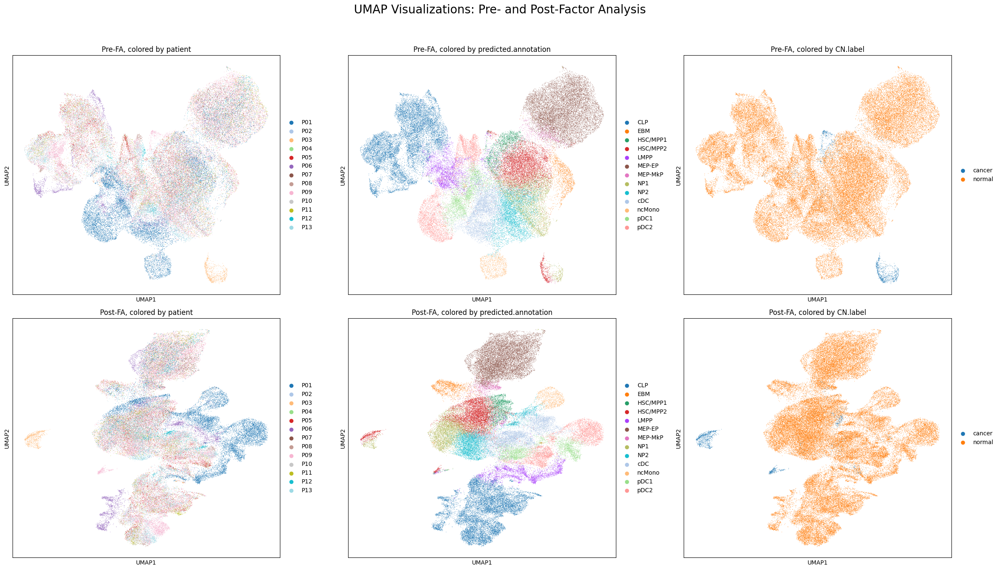

In [6]:
# --- Enhanced UMAP Visualization ---
print("--- Generating Enhanced UMAP Visualizations ---")

# Define the metadata columns to plot
color_by_columns = ['patient', 'predicted.annotation', 'CN.label']

# Check if the data is available
if 'adata_processed' in locals() and 'adata_transformed' in locals():
    
    # Create a figure with a 2x3 grid
    fig, axes = plt.subplots(2, 3, figsize=(24, 14))
    fig.suptitle("UMAP Visualizations: Pre- and Post-Factor Analysis", fontsize=20, y=1.0)

    # --- Generate Plots ---
    for i, col in enumerate(color_by_columns):
        
        # --- Top Row: Pre-FA (Processed Data) ---
        ax_pre = axes[0, i]
        if col in adata_processed.obs.columns:
            sc.pl.umap(
                adata_processed,
                color=col,
                title=f'Pre-FA, colored by {col}',
                ax=ax_pre,
                show=False,
                palette='tab20' if col == 'patient' else None  # Use a distinct palette for patients
            )
        else:
            ax_pre.text(0.5, 0.5, f"'{col}' not found\nin pre-FA data", ha='center', va='center', fontsize=12)
            ax_pre.set_title(f'Pre-FA, colored by {col}')
            ax_pre.set_xticks([])
            ax_pre.set_yticks([])

        # --- Bottom Row: Post-FA (Transformed Data) ---
        ax_post = axes[1, i]
        if col in adata_transformed.obs.columns:
            sc.pl.umap(
                adata_transformed,
                color=col,
                title=f'Post-FA, colored by {col}',
                ax=ax_post,
                show=False,
                palette='tab20' if col == 'patient' else None # Use a distinct palette for patients
            )
        else:
            ax_post.text(0.5, 0.5, f"'{col}' not found\nin post-FA data", ha='center', va='center', fontsize=12)
            ax_post.set_title(f'Post-FA, colored by {col}')
            ax_post.set_xticks([])
            ax_post.set_yticks([])

    plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    plt.show()

else:
    print("Please run the UMAP calculation cell (cell 13) first.")



In [3]:
### 3. GSEA Result Stability Analysis
print("--- Quantifying GSEA Result Stability Across Regularization Strengths ---")

pan_patient_indices = list(range(11, 20))

# For the per-patient "all_filtered" run
per_patient_all_filtered_indices = {
    'P01': list(range(10, 14)),
    'P02': list(range(12, 17)),
    'P03': list(range(12, 17)),
    'P04': list(range(11, 16)),
    'P05': list(range(10, 14)),
    'P06': list(range(9, 14)),
    'P07': [10, 11, 12, 13],
    'P09': list(range(12, 18)),
    'P13': list(range(11, 14))
}

# For the per-patient "deg_weak_screen" run
per_patient_deg_weak_indices = {
    'P01': list(range(9, 14)),
    'P02': list(range(11, 17)),
    'P03': list(range(10, 17)),
    'P04': list(range(10, 15)),
    'P05': list(range(10, 14)),
    'P06': [10, 11, 12, 13],
    'P07': [10, 11, 12, 13],
    'P09': list(range(12, 18)),
    'P13': [10, 11, 12, 13]
}

# --- Attach indices to the main experiments dictionary ---
experiments['pan_patient_all_filtered']['indices'] = pan_patient_indices
experiments['per_patient_all_filtered']['indices'] = per_patient_all_filtered_indices
experiments['per_patient_deg_weak']['indices'] = per_patient_deg_weak_indices

# We will analyze the stability for the two per-patient experiments
per_patient_experiments_to_analyze = {
    "per_patient_all_filtered": experiments["per_patient_all_filtered"],
    "per_patient_deg_weak": experiments["per_patient_deg_weak"]
}

gsea_stability_data = {}

for key, exp_data in per_patient_experiments_to_analyze.items():
    exp_id = exp_data['id']
    patient_indices = exp_data['indices']
    
    print(f"\n{'='*60}")
    print(f"--- Analyzing Experiment: {exp_data['label']} ---")
    print(f"{'='*60}")
    
    # Run the stability analysis
    gsea_stability_data[key] = analyzer.analyze_gsea_stability(exp_id, patient_indices)



--- Quantifying GSEA Result Stability Across Regularization Strengths ---

--- Analyzing Experiment: Per-Patient (All Filtered Genes) ---
--- Starting GSEA Stability Analysis for Experiment: 20250819_232404_fa_100_random_all_filtered_f85f0e07 ---
Loading experiment from: /home/minhang/mds_project/sc_classification/experiments/20250819_232404_fa_100_random_all_filtered_f85f0e07

Analyzing patient: P01
  - Found 25 unique significant pathways across 4 regularization strengths.
  - Average Jaccard similarity between consecutive strengths: 0.620
  - Top 5 most stable pathways:
    - HALLMARK_UNFOLDED_PROTEIN_RESPONSE (appeared in 100.00% of runs)
    - HALLMARK_APICAL_JUNCTION (appeared in 100.00% of runs)
    - HALLMARK_INFLAMMATORY_RESPONSE (appeared in 100.00% of runs)
    - HALLMARK_ALLOGRAFT_REJECTION (appeared in 100.00% of runs)
    - HALLMARK_COMPLEMENT (appeared in 100.00% of runs)

Analyzing patient: P02
  - Found 11 unique significant pathways across 5 regularization strengths.


--- Visualizing GSEA Stability ---


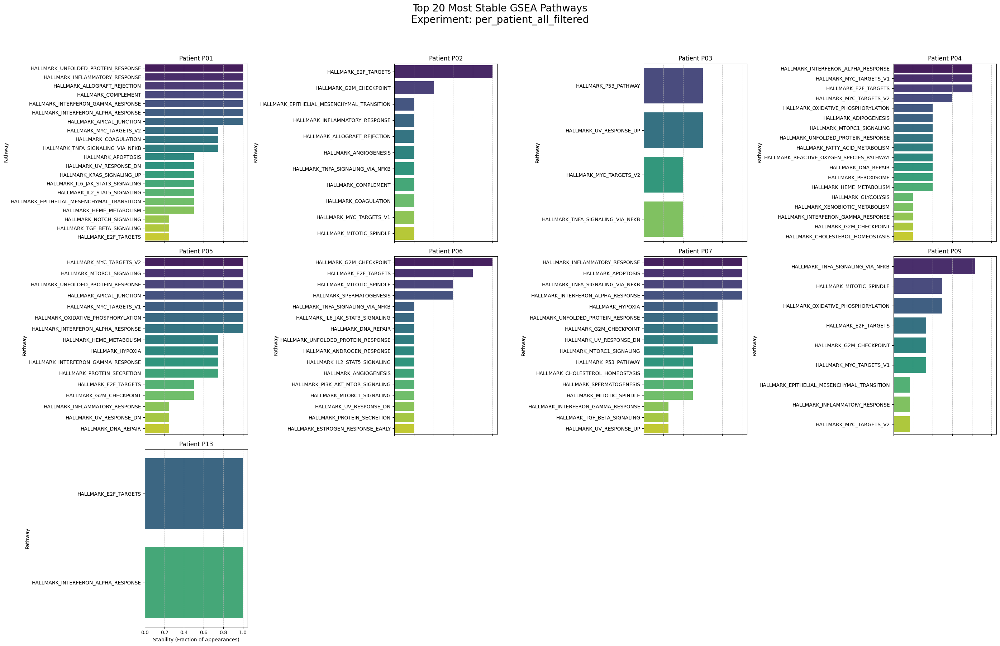

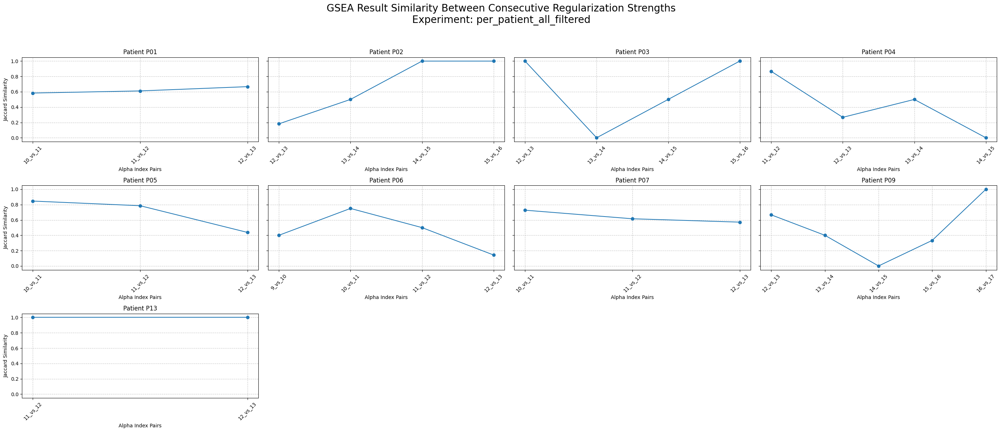

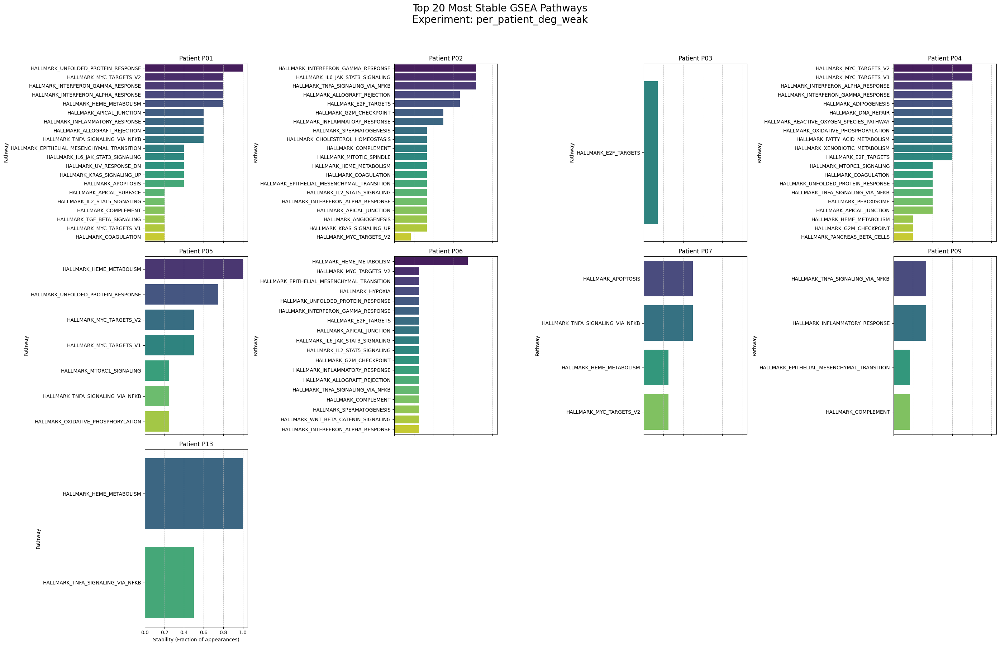

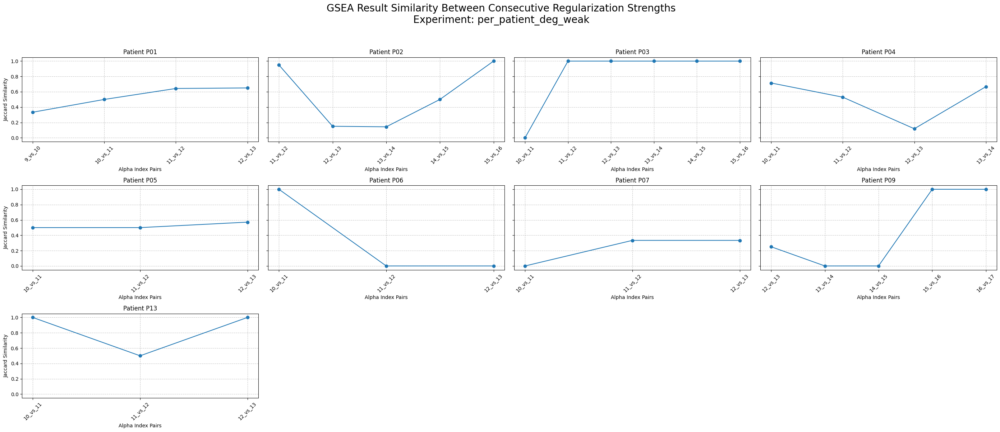

In [5]:
# --- Visualize GSEA Stability Results ---
print("--- Visualizing GSEA Stability ---")

for key, stability_results in gsea_stability_data.items():
    patient_ids = list(stability_results.keys())
    num_patients = len(patient_ids)
    
    if num_patients == 0:
        print(f"\nNo stability data to plot for experiment: {key}")
        continue
    
    # Define a layout for the plots, e.g., 4 plots per row
    plots_per_row = 4
    num_rows = (num_patients + plots_per_row - 1) // plots_per_row

    # --- Plot 1: Pathway Stability (Top 20) ---
    fig1, axes1 = plt.subplots(num_rows, plots_per_row, figsize=(7 * plots_per_row, 6 * num_rows), sharex=True, squeeze=False)
    axes1 = axes1.flatten()
    fig1.suptitle(f'Top 20 Most Stable GSEA Pathways\nExperiment: {key}', fontsize=20, y=1.0)

    for i, patient_id in enumerate(patient_ids):
        ax = axes1[i]
        data = stability_results[patient_id]
        top_20_pathways = data['pathway_stability'].head(20)
        
        if top_20_pathways.empty:
            ax.text(0.5, 0.5, "No significant pathways found", ha='center', va='center')
        else:
            # The 'hue', 'legend', and 'dodge' parameters are used to address the FutureWarning
            sns.barplot(x=top_20_pathways.values, y=top_20_pathways.index, hue=top_20_pathways.index, 
                      ax=ax, palette='viridis', legend=False, dodge=False)
            ax.set_xlabel('Stability (Fraction of Appearances)')
            ax.set_ylabel('Pathway')
        
        ax.set_title(f'Patient {patient_id}')
        ax.grid(axis='x', linestyle='--', alpha=0.7)

    # Hide any unused subplots
    for i in range(num_patients, len(axes1)):
        axes1[i].set_visible(False)

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

    # --- Plot 2: Jaccard Similarity Across Regularization Strengths ---
    fig2, axes2 = plt.subplots(num_rows, plots_per_row, figsize=(7 * plots_per_row, 4 * num_rows), sharey=True, squeeze=False)
    axes2 = axes2.flatten()
    fig2.suptitle(f'GSEA Result Similarity Between Consecutive Regularization Strengths\nExperiment: {key}', fontsize=20, y=1.0)

    for i, patient_id in enumerate(patient_ids):
        ax = axes2[i]
        data = stability_results[patient_id]
        jaccard_scores = data['jaccard_scores']
        
        if not jaccard_scores:
            ax.text(0.5, 0.5, "Not enough data points\nto calculate similarity", ha='center', va='center')
        else:
            ax.plot(jaccard_scores.keys(), jaccard_scores.values(), marker='o', linestyle='-')
            ax.set_xlabel('Alpha Index Pairs')
            ax.tick_params(axis='x', rotation=45)
        
        ax.set_title(f'Patient {patient_id}')
        ax.grid(True, linestyle='--', alpha=0.7)
        if i % plots_per_row == 0:
            ax.set_ylabel('Jaccard Similarity')

    # Hide any unused subplots
    for i in range(num_patients, len(axes2)):
        axes2[i].set_visible(False)

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()



--- Analyzing Interferon Alpha Response Gene Overlap in Key Factors (from Unsupervised Loadings) ---
experiment id: 20250819_232404_fa_100_random_all_filtered_f85f0e07
Loading experiment from: /home/minhang/mds_project/sc_classification/experiments/20250819_232404_fa_100_random_all_filtered_f85f0e07
--- Analyzing GSEA results for pathway: 'HALLMARK_INTERFERON_ALPHA_RESPONSE' ---
Source directory: /home/minhang/mds_project/sc_classification/experiments/20250819_232404_fa_100_random_all_filtered_f85f0e07/analysis/factor_interpretation/gsea_on_factors_original
  - Found 51 leading-edge genes for X_fa_36.
  - Found 34 leading-edge genes for X_fa_46.
  - Found 33 leading-edge genes for X_fa_88.


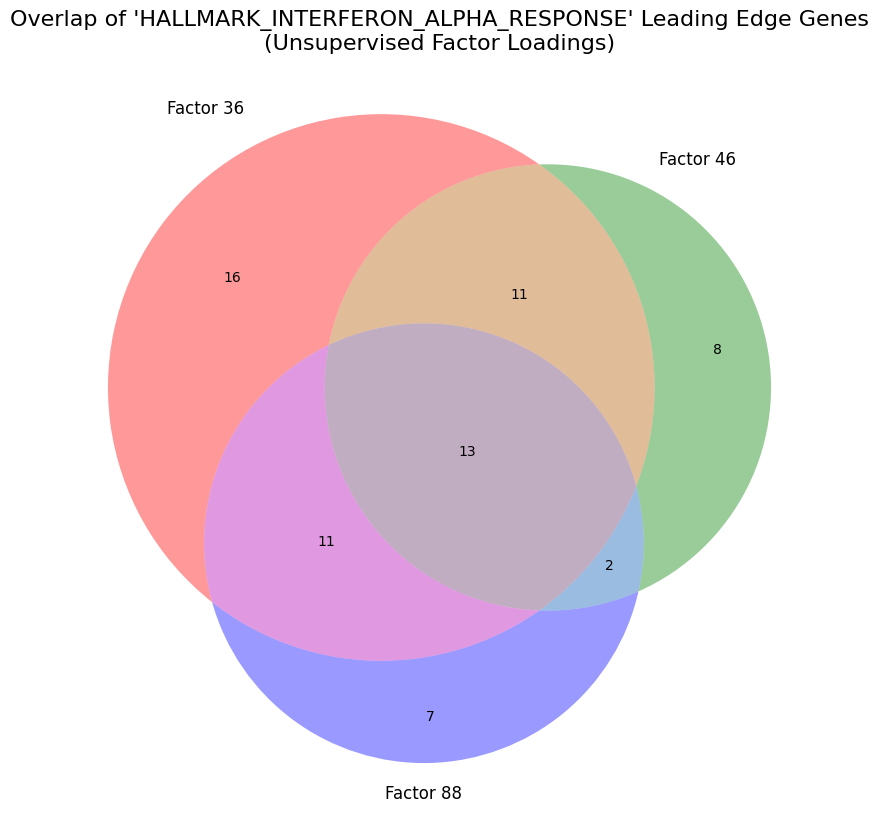


--- Overlap Analysis ---
Genes present in all three factors (13):
EPSTI1, HELZ2, IFI44L, IFIT3, ISG15, LAP3, LGALS3BP, LY6E, MX1, OASL, PARP12, PSME1, SAMD9L

Genes overlapping between Factor 36 and 46 (24):
B2M, BST2, EPSTI1, GBP4, GMPR, HELZ2, HLA-C, IFI44, IFI44L, IFIT3, IFITM2, IFITM3, IRF9, ISG15, LAP3, LGALS3BP, LY6E, MX1, OASL, PARP12, PSME1, SAMD9L, TXNIP, UBE2L6

Genes overlapping between Factor 36 and 88 (24):
CMPK2, CSF1, EIF2AK2, EPSTI1, GBP2, HELZ2, IFI35, IFI44L, IFIT3, ISG15, LAP3, LGALS3BP, LY6E, MX1, NMI, OASL, PARP12, PARP14, PARP9, PSMB9, PSME1, RSAD2, SAMD9L, TAP1

Genes overlapping between Factor 46 and 88 (15):
EPSTI1, HELZ2, IFI44L, IFIT3, ISG15, ISG20, LAP3, LGALS3BP, LY6E, MX1, OASL, PARP12, PSME1, SAMD9L, TRIM25

Genes unique to Factor 36 (16):
ADAR, IFIH1, IL15, IL4R, IRF1, NCOA7, PSMB8, PSME2, RIPK2, SAMD9, SP110, STAT2, TDRD7, TMEM140, UBA7, USP18

Genes unique to Factor 46 (8):
CASP8, CCRL2, DDX60, IFI27, IFI30, IFITM1, PNPT1, TENT5A

Genes unique to Fact

In [3]:
### Deeper Dive into Interferon Alpha Response Factors (Unsupervised Loadings)
from matplotlib_venn import venn3
import matplotlib.pyplot as plt

print("--- Analyzing Interferon Alpha Response Gene Overlap in Key Factors (from Unsupervised Loadings) ---")

# --- 1. Define Parameters ---
exp_key = "per_patient_all_filtered"
exp_id = experiments[exp_key]['id']
print("experiment id:", exp_id)
factors_to_analyze = ['X_fa_36', 'X_fa_46', 'X_fa_88']
pathway_name = 'HALLMARK_INTERFERON_ALPHA_RESPONSE'

# --- 2. Run the Analysis using the new function ---
try:
    leading_edge_genes = analyzer.analyze_unsupervised_gsea_overlap(
        experiment_id=exp_id,
        factors=factors_to_analyze,
        pathway_name=pathway_name
    )

    # --- 3. Visualize the Overlap ---
    gene_sets_for_venn = [
        leading_edge_genes.get('X_fa_36', set()),
        leading_edge_genes.get('X_fa_46', set()),
        leading_edge_genes.get('X_fa_88', set())
    ]
    factor_labels = ('Factor 36', 'Factor 46', 'Factor 88')

    if any(gene_sets_for_venn):
        plt.figure(figsize=(10, 10))
        venn3(gene_sets_for_venn, set_labels=factor_labels)
        plt.title(f"Overlap of '{pathway_name}' Leading Edge Genes\n(Unsupervised Factor Loadings)", fontsize=16)
        plt.show()

        # --- 4. Print Overlapping Gene Lists ---
        intersection_all = set.intersection(*[s for s in gene_sets_for_venn if s])
        print(f"\n--- Overlap Analysis ---")
        print(f"Genes present in all three factors ({len(intersection_all)}):")
        print(", ".join(sorted(list(intersection_all))) if intersection_all else "None")

        # Pairwise intersections
        set36 = gene_sets_for_venn[0]
        set46 = gene_sets_for_venn[1]
        set88 = gene_sets_for_venn[2]
        
        intersection_36_46 = set36.intersection(set46)
        print(f"\nGenes overlapping between Factor 36 and 46 ({len(intersection_36_46)}):")
        print(", ".join(sorted(list(intersection_36_46))) if intersection_36_46 else "None")

        intersection_36_88 = set36.intersection(set88)
        print(f"\nGenes overlapping between Factor 36 and 88 ({len(intersection_36_88)}):")
        print(", ".join(sorted(list(intersection_36_88))) if intersection_36_88 else "None")

        intersection_46_88 = set46.intersection(set88)
        print(f"\nGenes overlapping between Factor 46 and 88 ({len(intersection_46_88)}):")
        print(", ".join(sorted(list(intersection_46_88))) if intersection_46_88 else "None")

        unique_36 = set36 - set46 - set88
        print(f"\nGenes unique to Factor 36 ({len(unique_36)}):")
        print(", ".join(sorted(list(unique_36))) if unique_36 else "None")

        unique_46 = set46 - set36 - set88
        print(f"\nGenes unique to Factor 46 ({len(unique_46)}):")
        print(", ".join(sorted(list(unique_46))) if unique_46 else "None")

        unique_88 = set88 - set36 - set46
        print(f"\nGenes unique to Factor 88 ({len(unique_88)}):")
        print(", ".join(sorted(list(unique_88))) if unique_88 else "None")
    else:
        print("\nCould not find any leading edge genes to generate a Venn diagram.")

except Exception as e:
    print(f"An error occurred during the analysis: {e}")



--- Analyzing and Visualizing Interferon Alpha Response Gene Overlap ---
Loading experiment from: /home/minhang/mds_project/sc_classification/experiments/20250819_232404_fa_100_random_all_filtered_f85f0e07
--- Analyzing GSEA results for pathway: 'HALLMARK_INTERFERON_ALPHA_RESPONSE' ---
Source directory: /home/minhang/mds_project/sc_classification/experiments/20250819_232404_fa_100_random_all_filtered_f85f0e07/analysis/factor_interpretation/gsea_on_factors_original
  - Found 51 leading-edge genes for X_fa_36.
  - Found 34 leading-edge genes for X_fa_46.
  - Found 33 leading-edge genes for X_fa_88.


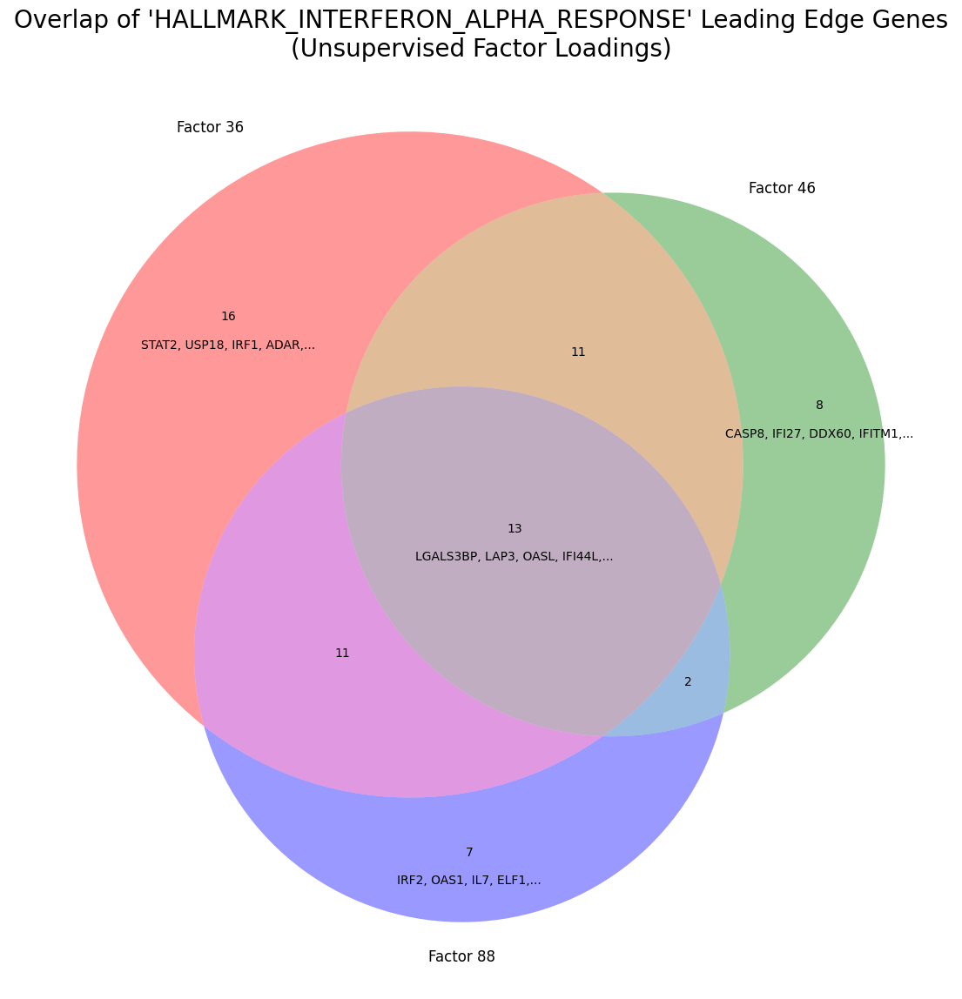


--- Detailed Overlap Analysis ---
Genes present in all three factors (13):
EPSTI1, HELZ2, IFI44L, IFIT3, ISG15, LAP3, LGALS3BP, LY6E, MX1, OASL, PARP12, PSME1, SAMD9L

Genes overlapping between Factor 36 and 46 (24):
B2M, BST2, EPSTI1, GBP4, GMPR, HELZ2, HLA-C, IFI44, IFI44L, IFIT3, IFITM2, IFITM3, IRF9, ISG15, LAP3, LGALS3BP, LY6E, MX1, OASL, PARP12, PSME1, SAMD9L, TXNIP, UBE2L6

Genes overlapping between Factor 36 and 88 (24):
CMPK2, CSF1, EIF2AK2, EPSTI1, GBP2, HELZ2, IFI35, IFI44L, IFIT3, ISG15, LAP3, LGALS3BP, LY6E, MX1, NMI, OASL, PARP12, PARP14, PARP9, PSMB9, PSME1, RSAD2, SAMD9L, TAP1

Genes overlapping between Factor 46 and 88 (15):
EPSTI1, HELZ2, IFI44L, IFIT3, ISG15, ISG20, LAP3, LGALS3BP, LY6E, MX1, OASL, PARP12, PSME1, SAMD9L, TRIM25

Genes unique to Factor 36 (16):
ADAR, IFIH1, IL15, IL4R, IRF1, NCOA7, PSMB8, PSME2, RIPK2, SAMD9, SP110, STAT2, TDRD7, TMEM140, UBA7, USP18

Genes unique to Factor 46 (8):
CASP8, CCRL2, DDX60, IFI27, IFI30, IFITM1, PNPT1, TENT5A

Genes uniqu

In [6]:
# Block 2: Consolidated Venn Diagram with Detailed Overlap Analysis
from matplotlib_venn import venn3
import matplotlib.pyplot as plt

print("--- Analyzing and Visualizing Interferon Alpha Response Gene Overlap ---")

# --- 1. Run Analysis to Get Gene Sets ---
# Ensure 'analyzer' and 'experiments' are defined from previous cells.
exp_key = "per_patient_all_filtered"
exp_id = experiments[exp_key]['id']
factors_to_analyze = ['X_fa_36', 'X_fa_46', 'X_fa_88']
pathway_name = 'HALLMARK_INTERFERON_ALPHA_RESPONSE'

try:
    leading_edge_genes = analyzer.analyze_unsupervised_gsea_overlap(
        experiment_id=exp_id,
        factors=factors_to_analyze,
        pathway_name=pathway_name
    )

    # --- 2. Visualize with Custom Labels ---
    gene_sets_for_venn = [
        leading_edge_genes.get('X_fa_36', set()),
        leading_edge_genes.get('X_fa_46', set()),
        leading_edge_genes.get('X_fa_88', set())
    ]
    factor_labels = ('Factor 36', 'Factor 46', 'Factor 88')

    if any(gene_sets_for_venn):
        plt.figure(figsize=(14, 14))
        v = venn3(gene_sets_for_venn, set_labels=factor_labels)
        plt.title(f"Overlap of '{pathway_name}' Leading Edge Genes\n(Unsupervised Factor Loadings)", fontsize=20)

        genes_to_display = {
            'fa_36': ['STAT2', 'USP18', 'IRF1', 'ADAR'],
            'fa_46': ['CASP8', 'IFI27', 'DDX60', 'IFITM1'],
            'fa_88': ['IRF2', 'OAS1', 'IL7', 'ELF1'],
            'all_overlap': ['LGALS3BP', 'LAP3', 'OASL', 'IFI44L']
        }
        
        # Add labels to the plot
        if v.get_label_by_id('100'): v.get_label_by_id('100').set_text(f"{v.get_label_by_id('100').get_text()}\n\n{', '.join(genes_to_display['fa_36'])},...")
        if v.get_label_by_id('010'): v.get_label_by_id('010').set_text(f"{v.get_label_by_id('010').get_text()}\n\n{', '.join(genes_to_display['fa_46'])},...")
        if v.get_label_by_id('001'): v.get_label_by_id('001').set_text(f"{v.get_label_by_id('001').get_text()}\n\n{', '.join(genes_to_display['fa_88'])},...")
        if v.get_label_by_id('111'): v.get_label_by_id('111').set_text(f"{v.get_label_by_id('111').get_text()}\n\n{', '.join(genes_to_display['all_overlap'])},...")

        plt.show()

        # --- 3. Print Detailed Overlap Analysis ---
        set36, set46, set88 = gene_sets_for_venn
        intersection_all = set.intersection(set36, set46, set88)
        intersection_36_46 = set36.intersection(set46)
        intersection_36_88 = set36.intersection(set88)
        intersection_46_88 = set46.intersection(set88)
        unique_36 = set36 - set46 - set88
        unique_46 = set46 - set36 - set88
        unique_88 = set88 - set36 - set46
        
        print(f"\n--- Detailed Overlap Analysis ---")
        print(f"Genes present in all three factors ({len(intersection_all)}):\n{', '.join(sorted(list(intersection_all))) if intersection_all else 'None'}")
        print(f"\nGenes overlapping between Factor 36 and 46 ({len(intersection_36_46)}):\n{', '.join(sorted(list(intersection_36_46))) if intersection_36_46 else 'None'}")
        print(f"\nGenes overlapping between Factor 36 and 88 ({len(intersection_36_88)}):\n{', '.join(sorted(list(intersection_36_88))) if intersection_36_88 else 'None'}")
        print(f"\nGenes overlapping between Factor 46 and 88 ({len(intersection_46_88)}):\n{', '.join(sorted(list(intersection_46_88))) if intersection_46_88 else 'None'}")
        print(f"\nGenes unique to Factor 36 ({len(unique_36)}):\n{', '.join(sorted(list(unique_36))) if unique_36 else 'None'}")
        print(f"\nGenes unique to Factor 46 ({len(unique_46)}):\n{', '.join(sorted(list(unique_46))) if unique_46 else 'None'}")
        print(f"\nGenes unique to Factor 88 ({len(unique_88)}):\n{', '.join(sorted(list(unique_88))) if unique_88 else 'None'}")

    else:
        print("\nCould not find any leading edge genes to generate a Venn diagram.")

except Exception as e:
    print(f"An error occurred during the analysis: {e}")

--- Analyzing Cell Type & Malignancy Activity Scores for Key Factors ---


/home/minhang/mds_project/sc_classification/utils/experiment_analysis.py:3116: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for group_name, group_df in data_to_agg.groupby(grouping_col):
/home/minhang/mds_project/sc_classification/utils/experiment_analysis.py:3118: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_scores = group_df.groupby(cell_type_col)[factors].mean().reindex(all_cell_types)
/home/minhang/mds_project/sc_classification/utils/experiment_analysis.py:3118: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False 

--- Cell Counts by Type and Malignancy Status ---
                      Malignant Cells  Healthy Cells
predicted.annotation                                
CLP                                 3          12178
EBM                                20           1346
HSC/MPP1                          175           1657
HSC/MPP2                          643           5984
LMPP                              175           3037
MEP-EP                             21          10512
MEP-MkP                            77            792
NP1                               286           4363
NP2                                44           4646
cDC                                82           5321
ncMono                              6           1067
pDC1                               20           3051
pDC2                               16           4596


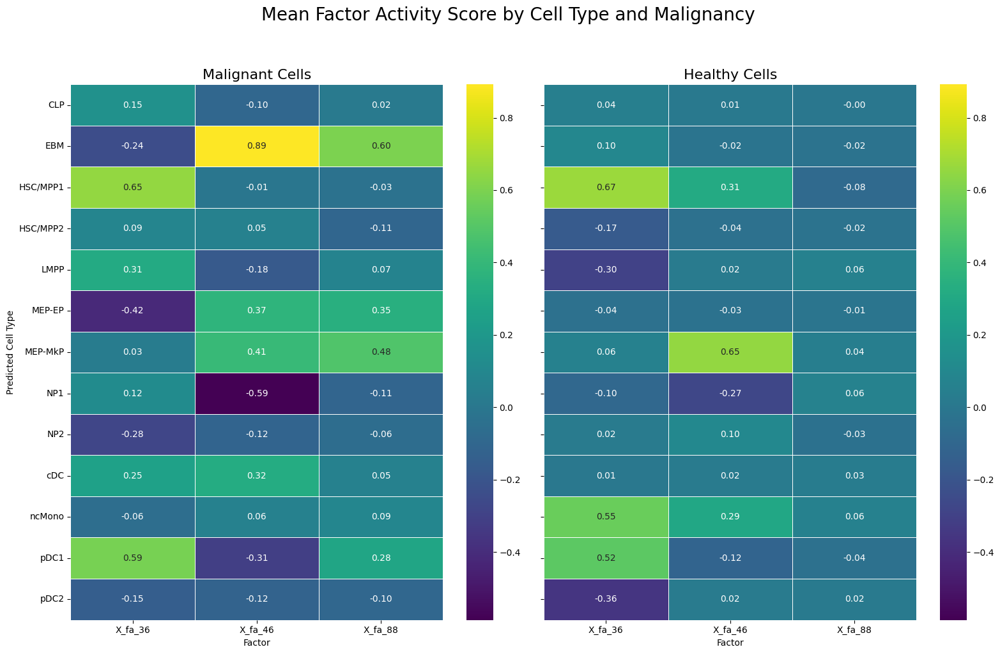

In [ ]:
### Cell Type & Malignancy Specificity of Key Factors (Patient-Subset View)

print("--- Analyzing Cell Type & Malignancy Activity Scores for Key Factors within Patient Subsets ---")

# --- 1. Parameters ---
# We'll use the pan-patient data as it contains all cell types and patients
exp_key = "pan_patient_all_filtered"
exp_data = experiments[exp_key]
adata_transformed_path = exp_data['path'] / "models" / "fa_100" / "transformed_data.h5ad"
adata_transformed = sc.read_h5ad(adata_transformed_path)

# Define the factors we want to see on the final heatmaps
factors_to_visualize = ['X_fa_36', 'X_fa_46', 'X_fa_88']
cell_type_col = 'predicted.annotation'
grouping_col = 'CN.label'

# Define the mapping of each "driving" factor to its relevant patient subset
factor_patient_map = {
    'X_fa_46': ['P02', 'P13', 'P05', 'P07'],
    'X_fa_36': ['P13', 'P05', 'P01', 'P07'],
    'X_fa_88': ['P05', 'P01', 'P06']
}

# --- 2. Iterate through each factor to calculate scores from its specific patient subset ---
all_cancer_scores = {}
all_healthy_scores = {}
subset_cell_counts_summary = []

print("\n--- Processing each factor with its relevant patient subset ---")
for driving_factor, patients in factor_patient_map.items():
    print(f"  - Calculating scores for {driving_factor} using patients: {', '.join(patients)}")
    
    # --- a. Subset the data ---
    adata_subset = adata_transformed[adata_transformed.obs['patient'].isin(patients)].copy()

    # --- b. Store cell counts for summary ---
    total_cell_counts = adata_subset.obs[grouping_col].value_counts()
    subset_cell_counts_summary.append(
        f"For {driving_factor} (Patients: {', '.join(patients)}):\n"
        f"  - Malignant Cells: {total_cell_counts.get('cancer', 0)}\n"
        f"  - Healthy Cells:   {total_cell_counts.get('normal', 0)}"
    )
    
    # --- c. Calculate scores for ONLY the current driving factor ---
    try:
        grouped_scores, _ = analyzer.calculate_cell_type_activity_score_grouped(
            adata=adata_subset,
            factors=[driving_factor],  # Calculate for one factor at a time
            cell_type_col=cell_type_col,
            grouping_col=grouping_col
        )
        
        # --- d. Store the resulting scores (as a Series) ---
        if 'cancer' in grouped_scores and not grouped_scores['cancer'].empty:
            all_cancer_scores[driving_factor] = grouped_scores['cancer'][driving_factor]
        if 'normal' in grouped_scores and not grouped_scores['normal'].empty:
            all_healthy_scores[driving_factor] = grouped_scores['normal'][driving_factor]

    except Exception as e:
        print(f"    -> An error occurred while processing {driving_factor}: {e}")

# --- 3. Print the cell count summary ---
print(f"\n\n{'='*80}")
print("--- Summary of Cell Counts in Each Patient Subset ---")
print(f"{'='*80}")
print("\n".join(subset_cell_counts_summary))

# --- 4. Combine scores and visualize ---
final_cancer_df = pd.DataFrame(all_cancer_scores).reindex(columns=factors_to_visualize)
final_healthy_df = pd.DataFrame(all_healthy_scores).reindex(columns=factors_to_visualize)

has_data_to_plot = not final_cancer_df.empty or not final_healthy_df.empty

if has_data_to_plot:
    # Determine common color scale across both final dataframes
    all_scores = []
    if not final_cancer_df.empty: all_scores.append(final_cancer_df.values)
    if not final_healthy_df.empty: all_scores.append(final_healthy_df.values)
    
    vmin = np.nanmin(np.concatenate(all_scores)) if all_scores else -0.5
    vmax = np.nanmax(np.concatenate(all_scores)) if all_scores else 0.5

    fig, axes = plt.subplots(1, 2, figsize=(16, 10), sharey=True)
    fig.suptitle('Mean Factor Activity (Calculated within Patient Subsets)', fontsize=20, y=1.02)

    # Malignant Heatmap
    sns.heatmap(
        final_cancer_df.sort_index(), cmap='viridis', annot=True, fmt=".2f", 
        linewidths=.5, ax=axes[0], vmin=vmin, vmax=vmax
    )
    axes[0].set_title("Malignant Cells", fontsize=16)
    axes[0].set_xlabel("Factor\n(from patient subset)")
    axes[0].set_ylabel("Predicted Cell Type")

    # Healthy Heatmap
    sns.heatmap(
        final_healthy_df.sort_index(), cmap='viridis', annot=True, fmt=".2f", 
        linewidths=.5, ax=axes[1], vmin=vmin, vmax=vmax
    )
    axes[1].set_title("Healthy Cells", fontsize=16)
    axes[1].set_xlabel("Factor\n(from patient subset)")
    axes[1].set_ylabel("")

    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()
else:
    print("\nCould not generate heatmap as no score data was found for any subset.")


--- Analyzing Cell Type & Malignancy Activity Scores for Key Factors within Patient Subsets ---



--- Processing each factor with its relevant patient subset ---
  - Calculating scores for X_fa_46 using patients: P02, P13, P05, P07


/home/minhang/mds_project/sc_classification/utils/experiment_analysis.py:3116: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for group_name, group_df in data_to_agg.groupby(grouping_col):
/home/minhang/mds_project/sc_classification/utils/experiment_analysis.py:3118: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_scores = group_df.groupby(cell_type_col)[factors].mean().reindex(all_cell_types)
/home/minhang/mds_project/sc_classification/utils/experiment_analysis.py:3118: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False 

  - Calculating scores for X_fa_36 using patients: P13, P05, P01, P07


/home/minhang/mds_project/sc_classification/utils/experiment_analysis.py:3116: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for group_name, group_df in data_to_agg.groupby(grouping_col):
/home/minhang/mds_project/sc_classification/utils/experiment_analysis.py:3118: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_scores = group_df.groupby(cell_type_col)[factors].mean().reindex(all_cell_types)
/home/minhang/mds_project/sc_classification/utils/experiment_analysis.py:3118: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False 

  - Calculating scores for X_fa_88 using patients: P05, P01, P06


/home/minhang/mds_project/sc_classification/utils/experiment_analysis.py:3116: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for group_name, group_df in data_to_agg.groupby(grouping_col):
/home/minhang/mds_project/sc_classification/utils/experiment_analysis.py:3118: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_scores = group_df.groupby(cell_type_col)[factors].mean().reindex(all_cell_types)
/home/minhang/mds_project/sc_classification/utils/experiment_analysis.py:3118: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False 



--- Summary of Total Cell Counts in Each Patient Subset ---
For X_fa_46 (Patients: P02, P13, P05, P07):
  - Malignant Cells: 245
  - Healthy Cells:   13535
For X_fa_36 (Patients: P13, P05, P01, P07):
  - Malignant Cells: 79
  - Healthy Cells:   24099
For X_fa_88 (Patients: P05, P01, P06):
  - Malignant Cells: 97
  - Healthy Cells:   19381


--- Detailed Cell Counts by Type in Each Patient Subset ---

--- Breakdown for X_fa_46 (Patients: P02, P13, P05, P07) ---
                      Malignant Cells  Healthy Cells
predicted.annotation                                
CLP                                 0           4262
EBM                                 0            238
HSC/MPP1                           75            418
HSC/MPP2                           56           1459
LMPP                               80            670
MEP-EP                              1           1833
MEP-MkP                             2            146
NP1                                 8            973
NP2

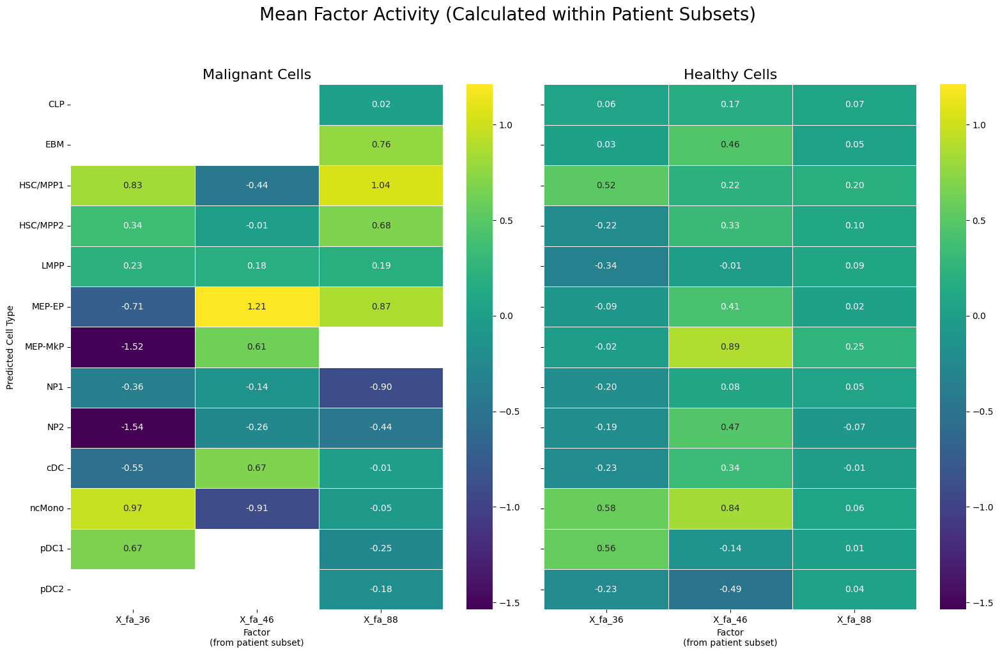

In [9]:
### Cell Type & Malignancy Specificity of Key Factors (Patient-Subset View)

print("--- Analyzing Cell Type & Malignancy Activity Scores for Key Factors within Patient Subsets ---")

# --- 1. Parameters ---
# Ensure the 'analyzer' and 'experiments' variables are available from previous cells
# We'll use the pan-patient data as it contains all cell types and patients
exp_key = "pan_patient_all_filtered"
exp_data = experiments[exp_key]
adata_transformed_path = exp_data['path'] / "models" / "fa_100" / "transformed_data.h5ad"
adata_transformed = sc.read_h5ad(adata_transformed_path)

# Define the factors we want to see on the final heatmaps
factors_to_visualize = ['X_fa_36', 'X_fa_46', 'X_fa_88']
cell_type_col = 'predicted.annotation'
grouping_col = 'CN.label'

# Define the mapping of each "driving" factor to its relevant patient subset
factor_patient_map = {
    'X_fa_46': ['P02', 'P13', 'P05', 'P07'],
    'X_fa_36': ['P13', 'P05', 'P01', 'P07'],
    'X_fa_88': ['P05', 'P01', 'P06']
}

# --- 2. Iterate through each factor to calculate scores and counts from its specific patient subset ---
all_cancer_scores = {}
all_healthy_scores = {}
subset_cell_counts_summary = []
detailed_counts_map = {}

print("\n--- Processing each factor with its relevant patient subset ---")
for driving_factor, patients in factor_patient_map.items():
    print(f"  - Calculating scores for {driving_factor} using patients: {', '.join(patients)}")
    
    # --- a. Subset the data ---
    adata_subset = adata_transformed[adata_transformed.obs['patient'].isin(patients)].copy()

    # --- b. Store total cell counts for summary ---
    total_cell_counts = adata_subset.obs[grouping_col].value_counts()
    subset_cell_counts_summary.append(
        f"For {driving_factor} (Patients: {', '.join(patients)}):\n"
        f"  - Malignant Cells: {total_cell_counts.get('cancer', 0)}\n"
        f"  - Healthy Cells:   {total_cell_counts.get('normal', 0)}"
    )
    
    # --- c. Calculate scores and detailed counts for ONLY the current driving factor ---
    try:
        grouped_scores, grouped_counts = analyzer.calculate_cell_type_activity_score_grouped(
            adata=adata_subset,
            factors=[driving_factor],  # Calculate for one factor at a time
            cell_type_col=cell_type_col,
            grouping_col=grouping_col
        )
        
        # --- d. Store the resulting scores (as a Series) ---
        if 'cancer' in grouped_scores and not grouped_scores['cancer'].empty:
            all_cancer_scores[driving_factor] = grouped_scores['cancer'][driving_factor]
        if 'normal' in grouped_scores and not grouped_scores['normal'].empty:
            all_healthy_scores[driving_factor] = grouped_scores['normal'][driving_factor]
        
        # --- e. Store the detailed cell count breakdown ---
        cancer_counts = grouped_counts.get('cancer', pd.Series(dtype='int'))
        normal_counts = grouped_counts.get('normal', pd.Series(dtype='int'))
        counts_df = pd.DataFrame({'Malignant Cells': cancer_counts, 'Healthy Cells': normal_counts}).fillna(0).astype(int)
        detailed_counts_map[driving_factor] = counts_df.sort_index()

    except Exception as e:
        print(f"    -> An error occurred while processing {driving_factor}: {e}")

# --- 3. Print the cell count summary and detailed breakdowns ---
print(f"\n\n{'='*80}")
print("--- Summary of Total Cell Counts in Each Patient Subset ---")
print(f"{'='*80}")
print("\n".join(subset_cell_counts_summary))

print(f"\n\n{'='*80}")
print("--- Detailed Cell Counts by Type in Each Patient Subset ---")
print(f"{'='*80}")
for factor, counts_df in detailed_counts_map.items():
    print(f"\n--- Breakdown for {factor} (Patients: {', '.join(factor_patient_map[factor])}) ---")
    print(counts_df)
    print("-" * 50)


# --- 4. Combine scores and visualize (Plotting logic remains the same) ---
final_cancer_df = pd.DataFrame(all_cancer_scores).reindex(columns=factors_to_visualize)
final_healthy_df = pd.DataFrame(all_healthy_scores).reindex(columns=factors_to_visualize)

has_data_to_plot = not final_cancer_df.empty or not final_healthy_df.empty

if has_data_to_plot:
    # Determine common color scale across both final dataframes
    all_combined_scores = []
    if not final_cancer_df.empty:
        all_combined_scores.append(final_cancer_df.values)
    if not final_healthy_df.empty:
        all_combined_scores.append(final_healthy_df.values)
    
    vmin = np.nanmin(np.concatenate(all_combined_scores)) if all_combined_scores else -0.5
    vmax = np.nanmax(np.concatenate(all_combined_scores)) if all_combined_scores else 0.5

    fig, axes = plt.subplots(1, 2, figsize=(16, 10), sharey=True)
    fig.suptitle('Mean Factor Activity (Calculated within Patient Subsets)', fontsize=20, y=1.02)

    # Malignant Heatmap
    sns.heatmap(
        final_cancer_df.sort_index(), cmap='viridis', annot=True, fmt=".2f", 
        linewidths=.5, ax=axes[0], vmin=vmin, vmax=vmax
    )
    axes[0].set_title("Malignant Cells", fontsize=16)
    axes[0].set_xlabel("Factor\n(from patient subset)")
    axes[0].set_ylabel("Predicted Cell Type")

    # Healthy Heatmap
    sns.heatmap(
        final_healthy_df.sort_index(), cmap='viridis', annot=True, fmt=".2f", 
        linewidths=.5, ax=axes[1], vmin=vmin, vmax=vmax
    )
    axes[1].set_title("Healthy Cells", fontsize=16)
    axes[1].set_xlabel("Factor\n(from patient subset)")
    axes[1].set_ylabel("")

    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()
else:
    print("\nCould not generate heatmap as no score data was found for any subset.")

In [10]:
import pandas as pd

# --- Generate Formatted Printout of Heatmap Scores ---

# Ensure the 'final_cancer_df' and 'final_healthy_df' DataFrames are available from the previous cell.
if 'final_cancer_df' in locals() and 'final_healthy_df' in locals():
    print(f"\n{'='*80}")
    print("--- Formatted Scores for Copy-Pasting ---")
    print(f"{'='*80}")

    # Process Malignant Cells Data
    print("\n--- Malignant Cells ---")
    for factor in final_cancer_df.columns:
        # Get the series for the current factor and drop any cell types with NaN scores
        scores_series = final_cancer_df[factor].dropna()
        
        # Format the string for each cell type and its score
        formatted_scores = [f"{index} {score:.2f}" for index, score in scores_series.items()]
        
        # Join the list into a single line and print
        print(f"\nfactor {factor.replace('X_', '')} in malignant cells: {', '.join(formatted_scores)}")

    # Process Healthy Cells Data
    print("\n\n--- Healthy Cells ---")
    for factor in final_healthy_df.columns:
        # Get the series for the current factor and drop any cell types with NaN scores
        scores_series = final_healthy_df[factor].dropna()
        
        # Format the string for each cell type and its score
        formatted_scores = [f"{index} {score:.2f}" for index, score in scores_series.items()]
        
        # Join the list into a single line and print
        print(f"\nfactor {factor.replace('X_', '')} in healthy cells: {', '.join(formatted_scores)}")
        
else:
    print("Could not generate formatted printout because the 'final_cancer_df' and 'final_healthy_df' DataFrames were not found.")
    print("Please make sure to run the previous cell that generates the heatmap first.")



--- Formatted Scores for Copy-Pasting ---

--- Malignant Cells ---

factor fa_36 in malignant cells: HSC/MPP1 0.83, HSC/MPP2 0.34, LMPP 0.23, MEP-EP -0.71, MEP-MkP -1.52, NP1 -0.36, NP2 -1.54, cDC -0.55, ncMono 0.97, pDC1 0.67

factor fa_46 in malignant cells: HSC/MPP1 -0.44, HSC/MPP2 -0.01, LMPP 0.18, MEP-EP 1.21, MEP-MkP 0.61, NP1 -0.14, NP2 -0.26, cDC 0.67, ncMono -0.91

factor fa_88 in malignant cells: CLP 0.02, EBM 0.76, HSC/MPP1 1.04, HSC/MPP2 0.68, LMPP 0.19, MEP-EP 0.87, NP1 -0.90, NP2 -0.44, cDC -0.01, ncMono -0.05, pDC1 -0.25, pDC2 -0.18


--- Healthy Cells ---

factor fa_36 in healthy cells: CLP 0.06, EBM 0.03, HSC/MPP1 0.52, HSC/MPP2 -0.22, LMPP -0.34, MEP-EP -0.09, MEP-MkP -0.02, NP1 -0.20, NP2 -0.19, cDC -0.23, ncMono 0.58, pDC1 0.56, pDC2 -0.23

factor fa_46 in healthy cells: CLP 0.17, EBM 0.46, HSC/MPP1 0.22, HSC/MPP2 0.33, LMPP -0.01, MEP-EP 0.41, MEP-MkP 0.89, NP1 0.08, NP2 0.47, cDC 0.34, ncMono 0.84, pDC1 -0.14, pDC2 -0.49

factor fa_88 in healthy cells: CLP 0.07, 

--- Visualizing Gene Loadings for Interferon Alpha Response Genes ---
Loading experiment from: /home/minhang/mds_project/sc_classification/experiments/20250819_232404_fa_100_random_all_filtered_f85f0e07
--- Analyzing GSEA results for pathway: 'HALLMARK_INTERFERON_ALPHA_RESPONSE' ---
Source directory: /home/minhang/mds_project/sc_classification/experiments/20250819_232404_fa_100_random_all_filtered_f85f0e07/analysis/factor_interpretation/gsea_on_factors_original
  - Found 51 leading-edge genes for X_fa_36.
  - Found 34 leading-edge genes for X_fa_46.
  - Found 33 leading-edge genes for X_fa_88.
Found 68 unique leading-edge genes for 'HALLMARK_INTERFERON_ALPHA_RESPONSE' across the 3 factors.
Generating clustered heatmap of gene loadings...


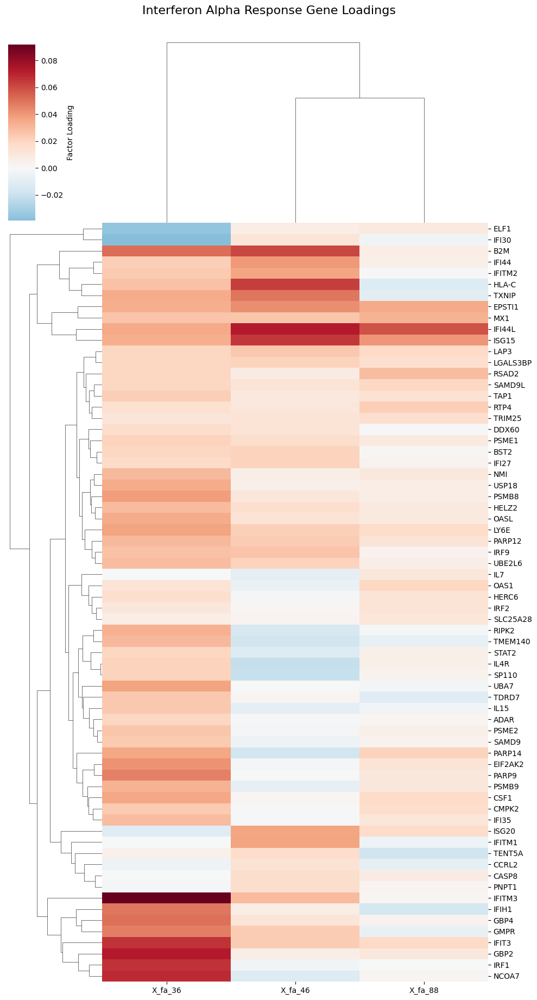

In [5]:
# Block 1: Gene Loadings for Interferon Alpha Response Genes
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scanpy as sc
from pathlib import Path

print("--- Visualizing Gene Loadings for Interferon Alpha Response Genes ---")

# --- 1. Load Data & Get Gene Sets ---
# Ensure 'analyzer' and 'experiments' are defined from previous cells.
exp_key = "per_patient_all_filtered"
exp_id = experiments[exp_key]['id']
pathway_name = 'HALLMARK_INTERFERON_ALPHA_RESPONSE'
factors_of_interest = ['X_fa_36', 'X_fa_46', 'X_fa_88']

# Get the leading edge genes for the pathway from our factors
leading_edge_genes = analyzer.analyze_unsupervised_gsea_overlap(
    experiment_id=exp_id,
    factors=factors_of_interest,
    pathway_name=pathway_name
)

# Combine all unique leading-edge genes into a single list
interferon_genes = sorted(list(set.union(*leading_edge_genes.values())))
print(f"Found {len(interferon_genes)} unique leading-edge genes for '{pathway_name}' across the 3 factors.")

# --- 2. Extract and Format Factor Loadings ---
adata_path = experiments[exp_key]['path'] / "models" / "fa_100" / "transformed_data.h5ad"
adata_loadings = sc.read_h5ad(adata_path)

factor_names = [f'X_fa_{i+1}' for i in range(adata_loadings.varm['FA_loadings'].shape[1])]
loadings_df = pd.DataFrame(
    adata_loadings.varm['FA_loadings'],
    index=adata_loadings.var_names,
    columns=factor_names
)

# --- 3. Create Heatmap ---
# Subset the loadings DataFrame to only the interferon genes and factors of interest
heatmap_df = loadings_df.loc[interferon_genes, factors_of_interest]

# Create the clustered heatmap
print("Generating clustered heatmap of gene loadings...")
sns.clustermap(
    heatmap_df,
    cmap='RdBu_r',       # Red-White-Blue diverging colormap
    center=0,            # Center the colormap at zero
    figsize=(10, 18),
    yticklabels=True,    # Show gene names
    cbar_kws={'label': 'Factor Loading'}
)
plt.suptitle('Interferon Alpha Response Gene Loadings', fontsize=16, y=1.02)
plt.show()


--- Generating Individual Gene Loading Distribution Plots with Annotations ---


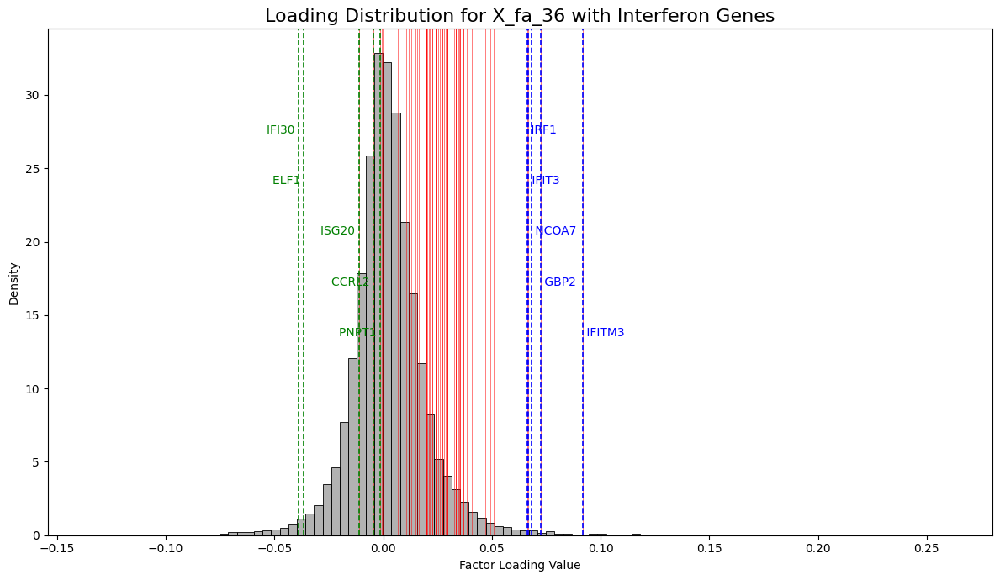

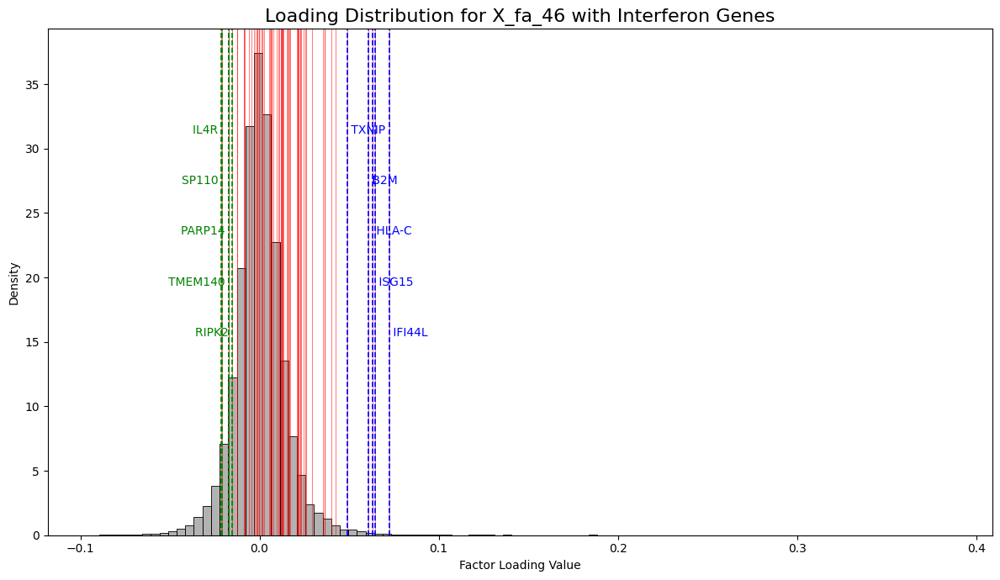

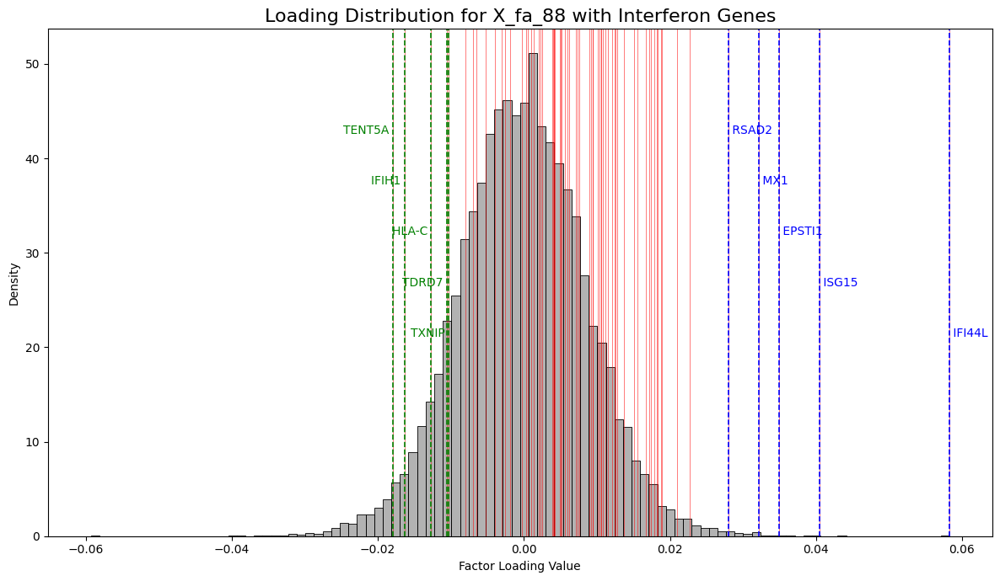

In [8]:
# Block 1: Individual, Annotated Gene Loading Distribution Plots
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# --- Generate Individual, Annotated Factor Loading Distributions ---

# Ensure 'loadings_df', 'interferon_genes', and 'factors_of_interest' are available.
if 'loadings_df' in locals() and 'interferon_genes' in locals():
    
    print(f"\n{'='*80}")
    print("--- Generating Individual Gene Loading Distribution Plots with Annotations ---")
    print(f"{'='*80}")

    # --- Loop through each factor to create a separate plot ---
    for factor in factors_of_interest:
        # Create a new figure for each plot
        plt.figure(figsize=(12, 7))
        ax = plt.gca() # Get current axes

        # Get all loadings for the current factor
        all_loadings = loadings_df[factor]
        
        # Get the loadings for only the interferon genes
        interferon_loadings = loadings_df.loc[interferon_genes, factor].sort_values()

        # Plot the histogram of all gene loadings
        sns.histplot(all_loadings, ax=ax, bins=100, color='grey', alpha=0.6, stat="density", label='All Genes Distribution')
        
        # Add a rug plot (vertical lines) for all interferon genes
        for loading in interferon_loadings:
            ax.axvline(loading, color='red', linestyle='-', linewidth=0.6, alpha=0.6)

        # --- Annotate Top and Bottom 5 Interferon Genes ---
        top_5_genes = interferon_loadings.tail(5)
        bottom_5_genes = interferon_loadings.head(5)

        # Use a small offset for text to prevent overlap with lines
        y_max = ax.get_ylim()[1]
        
        # Annotate top 5
        for i, (gene, loading) in enumerate(top_5_genes.items()):
            ax.text(loading, y_max * (0.8 - i*0.1), f' {gene}', color='blue', ha='left', va='center')
            ax.axvline(loading, color='blue', linestyle='--', linewidth=1.2) # Highlight the annotated lines

        # Annotate bottom 5
        for i, (gene, loading) in enumerate(bottom_5_genes.items()):
            ax.text(loading, y_max * (0.8 - i*0.1), f'{gene} ', color='green', ha='right', va='center')
            ax.axvline(loading, color='green', linestyle='--', linewidth=1.2) # Highlight the annotated lines

        ax.set_title(f"Loading Distribution for {factor} with Interferon Genes", fontsize=16)
        ax.set_xlabel("Factor Loading Value")
        ax.set_ylabel("Density")
        # ax.legend(handles=[plt.Line2D([0], [0], color='red', lw=1, label='Interferon Genes')])
        
        plt.tight_layout()
        plt.show()

else:
    print("Could not generate plots because 'loadings_df' and 'interferon_genes' were not found.")
    print("Please make sure to run the prerequisite cells first.")

In [5]:
# Block 2: 3D Cell State Visualization with Transparency
import pandas as pd
import plotly.express as px
import scanpy as sc
from pathlib import Path



print("\n--- Generating 3D Visualization of Cell States with Transparency ---")

# --- 1. Load and Subset Data (same as before) ---
# Ensure 'experiments' is available
exp_key = "pan_patient_all_filtered"
adata_path = experiments[exp_key]['path'] / "models" / "fa_100" / "transformed_data.h5ad"
adata_3d = sc.read_h5ad(adata_path)

factor_patient_map = {
    'X_fa_46': ['P02', 'P13', 'P05', 'P07'],
    'X_fa_36': ['P13', 'P05', 'P01', 'P07'],
    'X_fa_88': ['P05', 'P01', 'P06']
}
patients_of_interest = sorted(list(set(p for patients in factor_patient_map.values() for p in patients)))
cell_types_of_interest = ['HSC/MPP1', 'HSC/MPP2', 'LMPP']

adata_subset = adata_3d[
    adata_3d.obs['patient'].isin(patients_of_interest) &
    adata_3d.obs['predicted.annotation'].isin(cell_types_of_interest)
].copy()

# --- 2. Prepare DataFrame (same as before) ---
plot_df = pd.DataFrame(
    adata_subset.obsm['X_fa'],
    columns=[f'X_fa_{i+1}' for i in range(adata_subset.obsm['X_fa'].shape[1])],
    index=adata_subset.obs_names
)
factors_to_plot = ['X_fa_36', 'X_fa_46', 'X_fa_88']
metadata_cols = ['predicted.annotation', 'CN.label', 'patient']
plot_df = plot_df[factors_to_plot].join(adata_subset.obs[metadata_cols])

print(adata_subset.obs['predicted.annotation'].value_counts())
print(adata_subset.obs['CN.label'].value_counts())
print(adata_subset.obs['patient'].value_counts())

# --- 3. Generate Interactive 3D Plot with Opacity ---
print("Generating interactive 3D scatter plot...")
fig = px.scatter_3d(
    plot_df,
    x='X_fa_36',
    y='X_fa_46',
    z='X_fa_88',
    color='predicted.annotation',
    symbol='CN.label',
    hover_data=['patient'],
    title='Cell States in Factor Space (HSC/MPP & LMPP subsets)',
    labels={'color': 'Cell Type', 'symbol': 'Malignancy'},
    opacity=0.6  # --- Set point transparency here ---
)

# --- Update marker size for better density visualization ---
fig.update_traces(marker=dict(size=3))

fig.update_layout(
    margin=dict(l=0, r=0, b=0, t=40),
    legend_title_text='Legend'
)

fig.show()


--- Generating 3D Visualization of Cell States with Transparency ---
predicted.annotation
HSC/MPP2    2920
LMPP        2233
HSC/MPP1     845
Name: count, dtype: int64
CN.label
normal    5751
cancer     247
Name: count, dtype: int64
patient
P01    2805
P13    1172
P05    1069
P06     435
P02     278
P07     239
Name: count, dtype: int64
Generating interactive 3D scatter plot...


predicted.annotation
HSC/MPP2    2920
LMPP        2233
HSC/MPP1     845
Name: count, dtype: int64
CN.label
normal    5751
cancer     247
Name: count, dtype: int64
patient
P01    2805
P13    1172
P05    1069
P06     435
P02     278
P07     239
Name: count, dtype: int64
